In [7]:
from __future__ import division
import numpy as np
import scipy as sc
from itertools import product
import time
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
#import PIL
from numpy import log10
import random
from math import factorial
from scipy import stats
from scipy.stats import poisson, beta, mode, linregress, gaussian_kde, skewnorm, truncnorm, hypergeom
from scipy.spatial import distance

import warnings
import pandas as pd
import re
import os
import math
from collections import Counter
from sklearn.preprocessing import PolynomialFeatures
from statsmodels.stats.outliers_influence import summary_table
import statsmodels.api as sm
from scipy.optimize import linear_sum_assignment
import colorsys
from collections import Counter
import scipy.optimize as opt
import scipy.special as sp
import ot
import timeit
#import scipy.stats.mstats as mstats
from math import comb

from statsmodels.distributions.empirical_distribution import ECDF


from scipy.stats import poisson, mode
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2

warnings.filterwarnings('ignore')

%config InlineBackend.figure_formats = ['svg']
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}

pd.set_option('display.max_columns', None)


In [1048]:
import numpy as np
from scipy.stats import poisson, chi2, nbinom, gamma, binom
import matplotlib.pyplot as plt

def get_distribution(name):
    """Return scipy.stats distribution based on string name."""
    dist_map = {
        'poisson': poisson,
        'chi2': chi2,
        'nbinom': nbinom,
        'gamma': gamma,
        'binom': binom,
        'hypergeom': hypergeom,
        'lognorm': lognorm,
        'skewnorm': skewnorm,
    }
    return dist_map.get(name.lower(), None)


def is_discrete(dist_name):
    """Return True if distribution is discrete, else False."""
    discrete_dists = {'poisson', 'nbinom', 'binom'}
    return dist_name.lower() in discrete_dists


def find_optimal_mass_cutoff(dist_name, param, tolerance=0.01):
    """
    Finds highest mass cutoff s.t. truncated distribution approximates
    mean, variance, skewness, kurtosis within tolerance.
    """
    dist_name = dist_name.lower()
    dist = get_distribution(dist_name)
    if dist is None:
        raise ValueError(f"Distribution '{dist_name}' not supported.")
    
    # Create distribution object with params:
    if is_discrete(dist_name):
        # param is tuple for binom and nbinom, scalar for poisson
        if dist_name == 'poisson':
            dist_obj = dist(mu=float(param))
        else:
            dist_obj = dist(*param)
    else:
        # continuous
        dist_obj = dist(*param) if isinstance(param, (list, tuple)) else dist(param)
    
    full_mean = dist_obj.mean()
    full_var = dist_obj.var()
    full_skew = dist_obj.stats(moments='s')
    full_kurt = dist_obj.stats(moments='k')
    
    mass_cutoffs = np.linspace(0.9999, 0.9999999999, 500)
    
    for m in mass_cutoffs:
        lower_q = (1 - m) / 2
        upper_q = 1 - lower_q
        
        # Get truncation bounds
        L = dist_obj.ppf(lower_q)
        U = dist_obj.ppf(upper_q)
        
        # Adjust bounds for discrete vs continuous
        if is_discrete(dist_name):
            L = int(np.floor(L))
            U = int(np.ceil(U))
            support = np.arange(L, U + 1)
            pmf = dist_obj.pmf(support)
            total_mass = np.sum(pmf)
            if total_mass == 0:
                continue
            norm_pmf = pmf / total_mass
            mean = np.sum(support * norm_pmf)
            var = np.sum((support - mean)**2 * norm_pmf)
            std = np.sqrt(var)
            skew = np.sum((support - mean)**3 * norm_pmf) / std**3 if std > 0 else 0
            kurt = np.sum((support - mean)**4 * norm_pmf) / std**4 - 3 if std > 0 else 0
        else:
            # Continuous case
            cdf_L = dist_obj.cdf(L)
            cdf_U = dist_obj.cdf(U)
            mass = cdf_U - cdf_L
            if mass == 0:
                continue
            
            # Truncated mean
            mean = dist_obj.expect(lambda x: x, lb=L, ub=U) / mass
            var = dist_obj.expect(lambda x: (x - mean)**2, lb=L, ub=U) / mass
            std = np.sqrt(var)
            skew = dist_obj.expect(lambda x: (x - mean)**3, lb=L, ub=U) / mass / std**3 if std > 0 else 0
            kurt = dist_obj.expect(lambda x: (x - mean)**4, lb=L, ub=U) / mass / std**4 - 3 if std > 0 else 0

        # Check relative tolerance for all moments
        if all([
            abs(mean - full_mean) / full_mean < tolerance,
            abs(var - full_var) / full_var < tolerance,
            abs(skew - full_skew) / abs(full_skew) < tolerance if full_skew != 0 else True,
            abs(kurt - full_kurt) / abs(full_kurt) < tolerance if full_kurt != 0 else True,
        ]):
            return m

    return 0.999999999


def s_window_shift_and_skew(dist_name, param, mass_cutoff):
    """
    Computes Shift (𝒮), skewness, kurtosis, L, U, truncated mean and optionally variance.
    """
    dist_name = dist_name.lower()
    dist = get_distribution(dist_name)
    if dist is None:
        raise ValueError(f"Distribution '{dist_name}' not supported.")

    if is_discrete(dist_name):
        dist_obj = dist(mu=float(param)) if dist_name == 'poisson' else dist(*param)
    else:
        dist_obj = dist(*param) if isinstance(param, (list, tuple)) else dist(param)

    lower_q = (1 - mass_cutoff) / 2
    upper_q = 1 - lower_q

    try:
        L = dist_obj.ppf(lower_q)
        U = dist_obj.ppf(upper_q)
    except Exception:
        return (0, 0, 0, 0, 0, 0, 0)
        
    if is_discrete(dist_name):
        L = int(np.floor(L))
        U = int(np.ceil(U))
        if L >= U:
            return (0, 0, 0, L, U, 0, 0)
            
        support = np.arange(L, U + 1)
        pmf = dist_obj.pmf(support)
        total_mass = np.sum(pmf)

        if total_mass == 0:
            return (0, 0, 0, L, U, 0, 0)
            
        norm_pmf = pmf / total_mass
        mean_trunc = np.sum(support * norm_pmf)
        var_trunc = np.sum((support - mean_trunc)**2 * norm_pmf)
        std = np.sqrt(var_trunc)
        skew = np.sum((support - mean_trunc)**3 * norm_pmf) / std**3 if std > 0 else 0
        kurt = np.sum((support - mean_trunc)**4 * norm_pmf) / std**4 - 3 if std > 0 else 0
        shift = (U - mean_trunc) / (U - L) if U > L else 0
    else:
        # continuous
        if L >= U:
            return (0, 0, 0, L, U, 0, 0)
            
        cdf_L = dist_obj.cdf(L)
        cdf_U = dist_obj.cdf(U)
        mass = cdf_U - cdf_L
        if mass == 0:
            return (0, 0, 0, L, U, 0, 0)
            
        mean_trunc = dist_obj.expect(lambda x: x, lb=L, ub=U) / mass
        var_trunc = dist_obj.expect(lambda x: (x - mean_trunc)**2, lb=L, ub=U) / mass
        std = np.sqrt(var_trunc)
        skew = dist_obj.expect(lambda x: (x - mean_trunc)**3, lb=L, ub=U) / mass / std**3 if std > 0 else 0
        kurt = dist_obj.expect(lambda x: (x - mean_trunc)**4, lb=L, ub=U) / mass / std**4 - 3 if std > 0 else 0
        shift = (U - mean_trunc) / (U - L) if U > L else 0

    return shift, skew, kurt, L, U, mean_trunc, var_trunc
    

In [6]:

fs = 12

# Lambda values
lambdas = np.logspace(-3, 6, 100)

# Optimal mass cutoff
mass_cutoff = find_optimal_mass_cutoff('poisson', 100)
print('Optimal mass cutoff for Poisson:', mass_cutoff)

# Storage
shift_vals = []
skew_vals = []
kurt_vals = []
means = []
vars_ = []

# Compute stats
for lam in lambdas:
    shift, skew, kurt, L, U, mean, var = s_window_shift_and_skew('poisson', lam, mass_cutoff)
    shift_vals.append(shift)
    skew_vals.append(skew)
    kurt_vals.append(kurt)
    means.append(mean)
    vars_.append(var)

# Ground truth
true_means = np.array(lambdas)
true_vars = true_means
true_skews = 1 / np.sqrt(true_means)
true_kurts = 1 / true_means  # excess kurtosis

# Convert lists to arrays
means = np.array(means)
vars_ = np.array(vars_)
skew_vals = np.array(skew_vals)
kurt_vals = np.array(kurt_vals)
shift_vals = np.array(shift_vals)

poisson_shift_vals = list(shift_vals)
poisson_skew_vals = list(skew_vals)

poisson_text = r'$10^{-3} ≤ \lambda ≤ 10^{6}$'


Optimal mass cutoff for Poisson: 0.9999999999


In [1042]:
fx = [0.05, 0.2, 0.55, 0.1, 0.1]

#fx = [0.1, 0.2, 0.4, 0.2, 0.1]
print('f(x):', fx, '\n')

x_ls = [[0, 1, 2, 3, 4], # equally spaced
        [63, 64, 65, 66, 67], # equally spaced
        [0, 2, 4, 6, 8], # equally spaced
        [0, 7, 14, 21, 28], # equally spaced
        [2, 4, 8, 16, 32], # geometric
        [10**0, 10**1, 10**2, 10**3, 10**4], # geometric
        [1, 2, 3, 5, 8], # unevenly spaced
       ]

labs = ['equally spaced', 'equally spaced', 'equally spaced', 'equally spaced',
        'geometric', 'geometric', 'unevenly spaced',
       ]
for i, x in enumerate(x_ls):
    lab = labs[i]
    print('Scenario:', lab)
    print('x:', x)

    N = 100
    full_sample = []
    for i, xi in enumerate(x):
        full_sample.extend([xi]*int(fx[i]*N))

    x = np.asarray(x)
    fx = np.asarray(fx)

    L = np.min(x)
    U = np.max(x)
    C = np.sum(x*fx)

    print('L = ', L)
    print('C = ', round(C, 3))
    print('U = ', U, '\n')

    print('(U + L)/2:', (L + U)/2)
    print('𝒮 =', round((U - C)/(U - L),4), '\n')
    
    if lab == 'geometric':
        Cgm = np.log10(stats.gmean(full_sample))
        U = np.log10(U)
        L = np.log10(L)
        print('G-mean:', round(Cgm, 3))
        print('𝒮 =', round((U - Cgm)/(U - L),4), '\n')
    

    print('Skewness:', round(stats.skew(np.asarray(full_sample)), 4))

    mu = np.sum(fx * x)
    var = np.sum(fx * (x - mu)**2)
    std = np.sqrt(var)
    skew_val = np.sum(fx * (x - mu)**3) / std**3
    print('Weighted skewness:', np.round(skew_val, 2))
    print('=========================\n')



f(x): [0.05, 0.2, 0.55, 0.1, 0.1] 

Scenario: equally spaced
x: [0, 1, 2, 3, 4]
L =  0
C =  2.0
U =  4 

(U + L)/2: 2.0
𝒮 = 0.5 

Skewness: 0.3514
Weighted skewness: 0.35

Scenario: equally spaced
x: [63, 64, 65, 66, 67]
L =  63
C =  65.0
U =  67 

(U + L)/2: 65.0
𝒮 = 0.5 

Skewness: 0.3514
Weighted skewness: 0.35

Scenario: equally spaced
x: [0, 2, 4, 6, 8]
L =  0
C =  4.0
U =  8 

(U + L)/2: 4.0
𝒮 = 0.5 

Skewness: 0.3514
Weighted skewness: 0.35

Scenario: equally spaced
x: [0, 7, 14, 21, 28]
L =  0
C =  14.0
U =  28 

(U + L)/2: 14.0
𝒮 = 0.5 

Skewness: 0.3514
Weighted skewness: 0.35

Scenario: geometric
x: [2, 4, 8, 16, 32]
L =  2
C =  10.1
U =  32 

(U + L)/2: 17.0
𝒮 = 0.73 

G-mean: 0.903
𝒮 = 0.5 

Skewness: 1.9145
Weighted skewness: 1.91

Scenario: geometric
x: [1, 10, 100, 1000, 10000]
L =  1
C =  1157.05
U =  10000 

(U + L)/2: 5000.5
𝒮 = 0.8844 

G-mean: 2.0
𝒮 = 0.5 

Skewness: 2.6243
Weighted skewness: 2.62

Scenario: unevenly spaced
x: [1, 2, 3, 5, 8]
L =  1
C =  3.4
U =  8

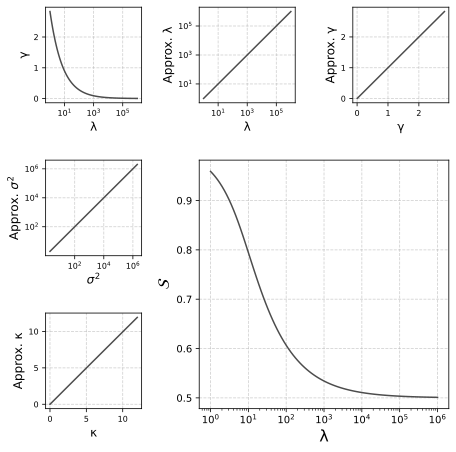

In [27]:
# === Plotting ===
fig = plt.figure(figsize=(10, 10))
gs = gridspec.GridSpec(4, 4)


# Skewness vs True Mean (top-left)
ax_center = fig.add_subplot(gs[0, 0])
ax_center.plot(true_means, true_skews, color='0.3')
ax_center.grid(True, linestyle='--', alpha=0.6)
ax_center.set_xscale('log')
ax_center.set_xlabel("λ", fontsize=fs)
ax_center.set_ylabel("γ", fontsize=fs)
ax_center.tick_params(which='both', labelsize=fs-4)

# Mean vs True (top-center)
ax_top_left = fig.add_subplot(gs[0, 1])
ax_top_left.plot(true_means, means, color='0.3')
ax_top_left.set_xscale('log')
ax_top_left.set_yscale('log')
ax_top_left.grid(True, linestyle='--', alpha=0.6)
ax_top_left.set_ylabel("Approx. λ", fontsize=fs)
ax_top_left.set_xlabel("λ", fontsize=fs)
ax_top_left.tick_params(which='both', labelsize=fs-4)


# Skewness vs True (top-right)
ax_top_right = fig.add_subplot(gs[0, 2])
ax_top_right.plot(true_skews, skew_vals, color='0.3')
ax_top_right.grid(True, linestyle='--', alpha=0.6)
ax_top_right.set_ylabel("Approx. γ", fontsize=fs)
ax_top_right.set_xlabel("γ", fontsize=fs)
ax_top_right.tick_params(which='both', labelsize=fs-4)

# Variance vs True (left-middle)
ax_left_middle = fig.add_subplot(gs[1, 0])
ax_left_middle.plot(true_vars, vars_, color='0.3')
ax_left_middle.grid(True, linestyle='--', alpha=0.6)
ax_left_middle.set_ylabel(r"Approx. $σ^{2}$", fontsize=fs)
ax_left_middle.set_xlabel(r"$σ^{2}$", fontsize=fs)
ax_left_middle.tick_params(which='both', labelsize=fs-4)
ax_left_middle.set_xscale('log')
ax_left_middle.set_yscale('log')


# Kurtosis vs True (left-bottom)
ax_left_bottom = fig.add_subplot(gs[2, 0])
ax_left_bottom.plot(true_kurts, kurt_vals, color='0.3')
ax_left_bottom.grid(True, linestyle='--', alpha=0.6)
ax_left_bottom.set_ylabel("Approx. κ", fontsize=fs)
ax_left_bottom.set_xlabel("κ", fontsize=fs)
ax_left_bottom.tick_params(which='both', labelsize=fs-4)

# Shift vs Mean (main)
ax_main = fig.add_subplot(gs[1:3, 1:3])
ax_main.plot(true_means, shift_vals, color='0.3')
ax_main.set_xscale('log')
ax_main.grid(True, linestyle='--', alpha=0.6)
ax_main.set_xlabel("λ", fontsize=fs+4)
ax_main.set_ylabel(r'$\mathcal{S}$', fontsize=fs+4)

# Final adjustments
plt.subplots_adjust(hspace=0.6, wspace=0.6)
fig.patch.set_facecolor('white')

plt.savefig('Final_Figs/manuscript/Fig1_poisson_square.jpg', bbox_inches='tight', format='jpg', dpi=600)
plt.savefig('Final_Figs/manuscript/Fig1_poisson_square.pdf', bbox_inches='tight', format='pdf', dpi=600)
plt.show()


Optimal mass cutoff for Chi-squared: 0.9999983966951904


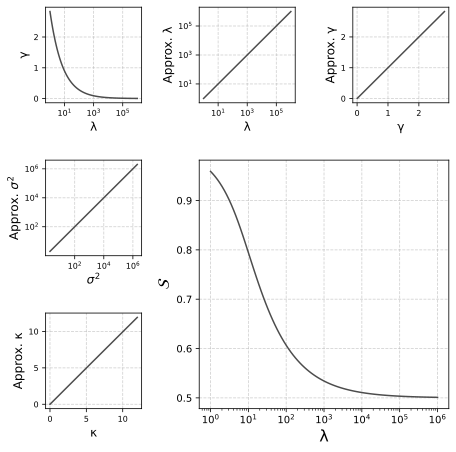

In [28]:
fs = 12

# Degrees of freedom
dfs = np.logspace(0, 6, 100)
chi_square_text = r'$1 ≤ k ≤ 10^{6}$'

mass_cutoff = find_optimal_mass_cutoff('chi2', 100)
print('Optimal mass cutoff for Chi-squared:', mass_cutoff)

# Storage
shift_vals = []
skew_vals = []
kurt_vals = []
means = []
vars_ = []

# Evaluation
for df in dfs:
    shift, skew, kurt, L, U, mean, var = s_window_shift_and_skew('chi2', df, mass_cutoff)
    shift_vals.append(shift)
    skew_vals.append(skew)
    kurt_vals.append(kurt)
    means.append(mean)
    vars_.append(var)

# Ground truth
true_means = np.array(dfs, dtype=float)
true_vars = 2 * true_means
true_skews = np.sqrt(8.0 / true_means)
true_kurts = 12.0 / true_means  # excess kurtosis

# Convert to np arrays
means = np.array(means)
vars_ = np.array(vars_)
skew_vals = np.array(skew_vals)
kurt_vals = np.array(kurt_vals)
shift_vals = np.array(shift_vals)

# === Plotting ===
fig = plt.figure(figsize=(10, 10))
gs = gridspec.GridSpec(4, 4)

# Skewness vs True Mean (top-left)
ax_center = fig.add_subplot(gs[0, 0])
ax_center.plot(true_means, true_skews, color='0.3')
ax_center.grid(True, linestyle='--', alpha=0.6)
ax_center.set_xscale('log')
ax_center.set_xlabel("λ", fontsize=fs)
ax_center.set_ylabel("γ", fontsize=fs)
ax_center.tick_params(which='both', labelsize=fs-4)

# Mean vs True (top-center)
ax_top_left = fig.add_subplot(gs[0, 1])
ax_top_left.plot(true_means, means, color='0.3')
ax_top_left.set_xscale('log')
ax_top_left.set_yscale('log')
ax_top_left.grid(True, linestyle='--', alpha=0.6)
ax_top_left.set_ylabel("Approx. λ", fontsize=fs)
ax_top_left.set_xlabel("λ", fontsize=fs)
ax_top_left.tick_params(which='both', labelsize=fs-4)


# Skewness vs True (top-right)
ax_top_right = fig.add_subplot(gs[0, 2])
ax_top_right.plot(true_skews, skew_vals, color='0.3')
ax_top_right.grid(True, linestyle='--', alpha=0.6)
ax_top_right.set_ylabel("Approx. γ", fontsize=fs)
ax_top_right.set_xlabel("γ", fontsize=fs)
ax_top_right.tick_params(which='both', labelsize=fs-4)

# Variance vs True (left-middle)
ax_left_middle = fig.add_subplot(gs[1, 0])
ax_left_middle.plot(true_vars, vars_, color='0.3')
ax_left_middle.grid(True, linestyle='--', alpha=0.6)
ax_left_middle.set_ylabel(r"Approx. $σ^{2}$", fontsize=fs)
ax_left_middle.set_xlabel(r"$σ^{2}$", fontsize=fs)
ax_left_middle.tick_params(which='both', labelsize=fs-4)
ax_left_middle.set_xscale('log')
ax_left_middle.set_yscale('log')


# Kurtosis vs True (left-bottom)
ax_left_bottom = fig.add_subplot(gs[2, 0])
ax_left_bottom.plot(true_kurts, kurt_vals, color='0.3')
ax_left_bottom.grid(True, linestyle='--', alpha=0.6)
ax_left_bottom.set_ylabel("Approx. κ", fontsize=fs)
ax_left_bottom.set_xlabel("κ", fontsize=fs)
ax_left_bottom.tick_params(which='both', labelsize=fs-4)

# Shift vs Mean (main)
ax_main = fig.add_subplot(gs[1:3, 1:3])
ax_main.plot(true_means, shift_vals, color='0.3')
ax_main.set_xscale('log')
ax_main.grid(True, linestyle='--', alpha=0.6)
ax_main.set_xlabel("λ", fontsize=fs+4)
ax_main.set_ylabel(r'$\mathcal{S}$', fontsize=fs+4)

# Layout and save
plt.subplots_adjust(hspace=0.6, wspace=0.6)
fig.patch.set_facecolor('white')

#plt.savefig('Final_Figs/manuscript/Fig_chisq_square.jpg', bbox_inches='tight', format='jpg', dpi=600)
#plt.savefig('Final_Figs/manuscript/Fig_chisq_square.pdf', bbox_inches='tight', format='pdf', dpi=600)
plt.show()

chi2_shift_vals = list(shift_vals)
chi2_skew_vals = list(skew_vals)

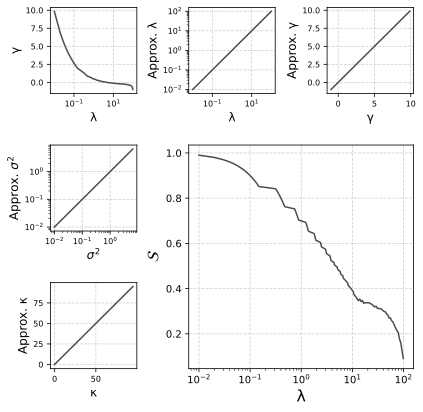

In [30]:
# Parameter space
n_vals = np.logspace(0, 2, 100, dtype=int)
p_vals = np.linspace(0.01, 0.99, 100)
param_grid = [(int(n), float(p)) for n, p in zip(n_vals, p_vals)]

# Storage
shift_vals = []
skew_vals = []
kurt_vals = []
vars_ = []
means = []
true_means = []
true_vars = []
true_skews = []
true_kurts = []

# Loop
for n, p in param_grid:
    #mass_cutoff = find_optimal_mass_cutoff('binom', (n, p))
    mass_cutoff = 0.999999999
    shift, skew, kurt, L, U, mean, var = s_window_shift_and_skew('binom', (n, p), mass_cutoff)
    shift_vals.append(shift)
    skew_vals.append(skew)
    kurt_vals.append(kurt)
    means.append(mean)
    vars_.append(var)
    
    # True moments
    mu = n * p
    sigma2 = n * p * (1 - p)
    skew_true = (1 - 2 * p) / np.sqrt(sigma2)
    kurt_true = (1 - 6 * p * (1 - p)) / sigma2
    
    true_means.append(mu)
    true_vars.append(sigma2)
    true_skews.append(skew_true)
    true_kurts.append(kurt_true)

# Convert to arrays
shift_vals = np.array(shift_vals)
skew_vals = np.array(skew_vals)
kurt_vals = np.array(kurt_vals)
vars_ = np.array(vars_)
means = np.array(means)
true_means = np.array(true_means)
true_vars = np.array(true_vars)
true_skews = np.array(true_skews)
true_kurts = np.array(true_kurts)


#### PLOTTING CODE

fs = 12
fig = plt.figure(figsize=(9, 9))
gs = gridspec.GridSpec(4, 4)

# Skewness vs True Mean (top-left)
ax_center = fig.add_subplot(gs[0, 0])
ax_center.plot(true_means, true_skews, color='0.3')
ax_center.grid(True, linestyle='--', alpha=0.6)
ax_center.set_xscale('log')
ax_center.set_xlabel("λ", fontsize=fs)
ax_center.set_ylabel("γ", fontsize=fs)
ax_center.tick_params(which='both', labelsize=fs-4)

# Mean vs True (top-center)
ax_top_left = fig.add_subplot(gs[0, 1])
ax_top_left.plot(true_means, means, color='0.3')
ax_top_left.set_xscale('log')
ax_top_left.set_yscale('log')
ax_top_left.grid(True, linestyle='--', alpha=0.6)
ax_top_left.set_ylabel("Approx. λ", fontsize=fs)
ax_top_left.set_xlabel("λ", fontsize=fs)
ax_top_left.tick_params(which='both', labelsize=fs-4)


# Skewness vs True (top-right)
ax_top_right = fig.add_subplot(gs[0, 2])
ax_top_right.plot(true_skews, skew_vals, color='0.3')
ax_top_right.grid(True, linestyle='--', alpha=0.6)
ax_top_right.set_ylabel("Approx. γ", fontsize=fs)
ax_top_right.set_xlabel("γ", fontsize=fs)
ax_top_right.tick_params(which='both', labelsize=fs-4)

# Variance vs True (left-middle)
ax_left_middle = fig.add_subplot(gs[1, 0])
ax_left_middle.plot(true_vars, vars_, color='0.3')
ax_left_middle.grid(True, linestyle='--', alpha=0.6)
ax_left_middle.set_ylabel(r"Approx. $σ^{2}$", fontsize=fs)
ax_left_middle.set_xlabel(r"$σ^{2}$", fontsize=fs)
ax_left_middle.tick_params(which='both', labelsize=fs-4)
ax_left_middle.set_xscale('log')
ax_left_middle.set_yscale('log')


# Kurtosis vs True (left-bottom)
ax_left_bottom = fig.add_subplot(gs[2, 0])
ax_left_bottom.plot(true_kurts, kurt_vals, color='0.3')
ax_left_bottom.grid(True, linestyle='--', alpha=0.6)
ax_left_bottom.set_ylabel("Approx. κ", fontsize=fs)
ax_left_bottom.set_xlabel("κ", fontsize=fs)
ax_left_bottom.tick_params(which='both', labelsize=fs-4)

# Shift vs Mean (main)
ax_main = fig.add_subplot(gs[1:3, 1:3])
ax_main.plot(true_means, shift_vals, color='0.3')
ax_main.set_xscale('log')
ax_main.grid(True, linestyle='--', alpha=0.6)
ax_main.set_xlabel("λ", fontsize=fs+4)
ax_main.set_ylabel(r'$\mathcal{S}$', fontsize=fs+4)

# Layout and save
plt.subplots_adjust(hspace=0.6, wspace=0.6)
fig.patch.set_facecolor('white')

plt.savefig('Final_Figs/manuscript/Fig_binomial.jpg', bbox_inches='tight', format='jpg', dpi=600)
plt.savefig('Final_Figs/manuscript/Fig_binomial.pdf', bbox_inches='tight', format='pdf', dpi=600)
plt.show()

binomial_shift_vals = list(shift_vals)
binomial_skew_vals = list(skew_vals)

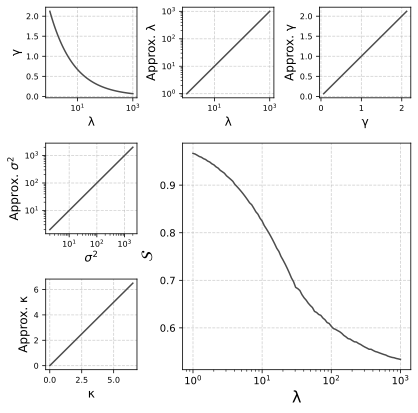

In [34]:

# Define parameters
r_vals = np.logspace(0, 3, 100)  # r from 1 to 1000
p = 0.5  # Fixed probability

negative_binomial_text = r'$1 ≤ r ≤ 10^{3}$' + '\n'
negative_binomial_text = r'$p = 0.5$' + '\n'

# Compute true statistics
true_means = r_vals * (1 - p) / p
true_vars = r_vals * (1 - p) / (p ** 2)
true_skews = (2 - p) / np.sqrt(r_vals * (1 - p))
true_kurts = 6 / r_vals + (p ** 2) / (r_vals * (1 - p))

# Initialize lists to store approximated statistics
shift_vals = []
means = []
vars_ = []
skew_vals = []
kurt_vals = []

# Compute approximated statistics
for r in r_vals:
    #mass_cutoff = find_optimal_mass_cutoff('nbinom', (r, p))
    mass_cutoff = 0.999999999
    shift, skew, kurt, L, U, mean, variance = s_window_shift_and_skew('nbinom', (r, p), mass_cutoff)
    shift_vals.append(shift)
    means.append(mean)
    vars_.append(variance)
    skew_vals.append(skew)
    kurt_vals.append(kurt)

# Convert lists to numpy arrays
shift_vals = np.array(shift_vals)
means = np.array(means)
vars_ = np.array(vars_)
skew_vals = np.array(skew_vals)
kurts_vals = np.array(kurt_vals)

# Plotting
fs = 12
fig = plt.figure(figsize=(9, 9))
gs = gridspec.GridSpec(4, 4)

# Skewness vs True Mean (top-left)
ax_center = fig.add_subplot(gs[0, 0])
ax_center.plot(true_means, true_skews, color='0.3')
ax_center.grid(True, linestyle='--', alpha=0.6)
ax_center.set_xscale('log')
ax_center.set_xlabel("λ", fontsize=fs)
ax_center.set_ylabel("γ", fontsize=fs)
ax_center.tick_params(which='both', labelsize=fs-4)

# Mean vs True (top-center)
ax_top_left = fig.add_subplot(gs[0, 1])
ax_top_left.plot(true_means, means, color='0.3')
ax_top_left.set_xscale('log')
ax_top_left.set_yscale('log')
ax_top_left.grid(True, linestyle='--', alpha=0.6)
ax_top_left.set_ylabel("Approx. λ", fontsize=fs)
ax_top_left.set_xlabel("λ", fontsize=fs)
ax_top_left.tick_params(which='both', labelsize=fs-4)


# Skewness vs True (top-right)
ax_top_right = fig.add_subplot(gs[0, 2])
ax_top_right.plot(true_skews, skew_vals, color='0.3')
ax_top_right.grid(True, linestyle='--', alpha=0.6)
ax_top_right.set_ylabel("Approx. γ", fontsize=fs)
ax_top_right.set_xlabel("γ", fontsize=fs)
ax_top_right.tick_params(which='both', labelsize=fs-4)

# Variance vs True (left-middle)
ax_left_middle = fig.add_subplot(gs[1, 0])
ax_left_middle.plot(true_vars, vars_, color='0.3')
ax_left_middle.grid(True, linestyle='--', alpha=0.6)
ax_left_middle.set_ylabel(r"Approx. $σ^{2}$", fontsize=fs)
ax_left_middle.set_xlabel(r"$σ^{2}$", fontsize=fs)
ax_left_middle.tick_params(which='both', labelsize=fs-4)
ax_left_middle.set_xscale('log')
ax_left_middle.set_yscale('log')


# Kurtosis vs True (left-bottom)
ax_left_bottom = fig.add_subplot(gs[2, 0])
ax_left_bottom.plot(true_kurts, kurt_vals, color='0.3')
ax_left_bottom.grid(True, linestyle='--', alpha=0.6)
ax_left_bottom.set_ylabel("Approx. κ", fontsize=fs)
ax_left_bottom.set_xlabel("κ", fontsize=fs)
ax_left_bottom.tick_params(which='both', labelsize=fs-4)

# Shift vs Mean (main)
ax_main = fig.add_subplot(gs[1:3, 1:3])
ax_main.plot(true_means, shift_vals, color='0.3')
ax_main.set_xscale('log')
ax_main.grid(True, linestyle='--', alpha=0.6)
ax_main.set_xlabel("λ", fontsize=fs+4)
ax_main.set_ylabel(r'$\mathcal{S}$', fontsize=fs+4)

# Adjust layout
plt.subplots_adjust(hspace=0.5, wspace=0.5)
fig.patch.set_facecolor('white')

# Save figures
#plt.savefig('Final_Figs/manuscript/Fig_nbinom_square.jpg', bbox_inches='tight', format='jpg', dpi=600)
#plt.savefig('Final_Figs/manuscript/Fig_nbinom_square.pdf', bbox_inches='tight', format='pdf', dpi=600)
plt.show()

negative_binomial_shift_vals = list(shift_vals)
negative_binomial_skew_vals = list(skew_vals)

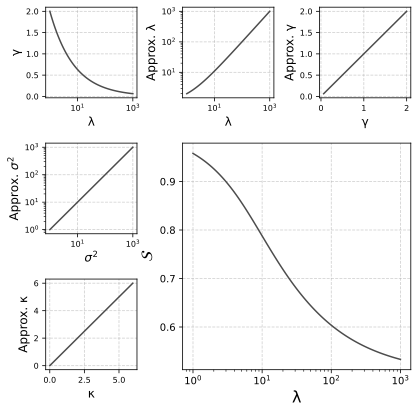

In [42]:

# Define parameters
shape_params = np.logspace(0, 3, 100)  # Shape parameter from 1 to 1000
scale = 1.0  # Fixed scale

gamma_text = r'$1 ≤ \alpha ≤ 10^{3}$' + '\n'
gamma_text = r'$\theta = 1$'

# Compute true statistics
true_means = shape_params * scale
true_vars = shape_params * (scale ** 2)
true_skews = 2 / np.sqrt(shape_params)
true_kurts = 6 / shape_params

# Initialize lists to store approximated statistics
shift_vals = []
means = []
vars_ = []
skew_vals = []
kurt_vals = []

# Compute approximated statistics
for shape in shape_params:
    #mass_cutoff = find_optimal_mass_cutoff('gamma', (shape, scale))
    mass_cutoff = 0.9999999999
    shift, skew, kurt, L, U, mean, variance = s_window_shift_and_skew('gamma', (shape, scale), mass_cutoff)
    shift_vals.append(shift)
    means.append(mean)
    vars_.append(variance)
    skew_vals.append(skew)
    kurt_vals.append(kurt)

# Convert lists to numpy arrays
shift_vals = np.array(shift_vals)
means = np.array(means)
vars_ = np.array(vars_)
skew_vals = np.array(skew_vals)
kurt_vals = np.array(kurt_vals)

# Plotting
fs = 12
fig = plt.figure(figsize=(9, 9))
gs = gridspec.GridSpec(4, 4)

# Skewness vs True Mean (top-left)
ax_center = fig.add_subplot(gs[0, 0])
ax_center.plot(true_means, true_skews, color='0.3')
ax_center.grid(True, linestyle='--', alpha=0.6)
ax_center.set_xscale('log')
ax_center.set_xlabel("λ", fontsize=fs)
ax_center.set_ylabel("γ", fontsize=fs)
ax_center.tick_params(which='both', labelsize=fs-4)

# Mean vs True (top-center)
ax_top_left = fig.add_subplot(gs[0, 1])
ax_top_left.plot(true_means, means, color='0.3')
ax_top_left.set_xscale('log')
ax_top_left.set_yscale('log')
ax_top_left.grid(True, linestyle='--', alpha=0.6)
ax_top_left.set_ylabel("Approx. λ", fontsize=fs)
ax_top_left.set_xlabel("λ", fontsize=fs)
ax_top_left.tick_params(which='both', labelsize=fs-4)


# Skewness vs True (top-right)
ax_top_right = fig.add_subplot(gs[0, 2])
ax_top_right.plot(true_skews, skew_vals, color='0.3')
ax_top_right.grid(True, linestyle='--', alpha=0.6)
ax_top_right.set_ylabel("Approx. γ", fontsize=fs)
ax_top_right.set_xlabel("γ", fontsize=fs)
ax_top_right.tick_params(which='both', labelsize=fs-4)

# Variance vs True (left-middle)
ax_left_middle = fig.add_subplot(gs[1, 0])
ax_left_middle.plot(true_vars, vars_, color='0.3')
ax_left_middle.grid(True, linestyle='--', alpha=0.6)
ax_left_middle.set_ylabel(r"Approx. $σ^{2}$", fontsize=fs)
ax_left_middle.set_xlabel(r"$σ^{2}$", fontsize=fs)
ax_left_middle.tick_params(which='both', labelsize=fs-4)
ax_left_middle.set_xscale('log')
ax_left_middle.set_yscale('log')


# Kurtosis vs True (left-bottom)
ax_left_bottom = fig.add_subplot(gs[2, 0])
ax_left_bottom.plot(true_kurts, kurt_vals, color='0.3')
ax_left_bottom.grid(True, linestyle='--', alpha=0.6)
ax_left_bottom.set_ylabel("Approx. κ", fontsize=fs)
ax_left_bottom.set_xlabel("κ", fontsize=fs)
ax_left_bottom.tick_params(which='both', labelsize=fs-4)

# Shift vs Mean (main)
ax_main = fig.add_subplot(gs[1:3, 1:3])
ax_main.plot(true_means, shift_vals, color='0.3')
ax_main.set_xscale('log')
ax_main.grid(True, linestyle='--', alpha=0.6)
ax_main.set_xlabel("λ", fontsize=fs+4)
ax_main.set_ylabel(r'$\mathcal{S}$', fontsize=fs+4)

# Adjust layout
plt.subplots_adjust(hspace=0.5, wspace=0.5)
fig.patch.set_facecolor('white')

# Save figures
plt.savefig('Final_Figs/manuscript/Fig_gamma_square.jpg', bbox_inches='tight', format='jpg', dpi=600)
plt.savefig('Final_Figs/manuscript/Fig_gamma_square.pdf', bbox_inches='tight', format='pdf', dpi=600)
plt.show()

gamma_shift_vals = list(shift_vals)
gamma_skew_vals = list(skew_vals)

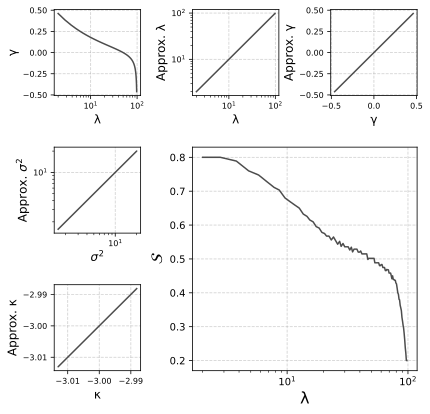

In [44]:

# Fixed parameters
M = 500
n = 100
K_vals = np.linspace(10, 490, 100, dtype=int)  # Vary # successes in population

# Storage
shift_vals, skew_vals, kurt_vals, means, vars_ = [], [], [], [], []
true_means, true_vars, true_skews, true_kurts = [], [], [], []

# Main loop
for K in K_vals:
    dist = hypergeom(M, K, n)
    x = np.arange(dist.ppf(1e-12), dist.ppf(1 - 1e-12) + 1)
    pmf = dist.pmf(x)
    
    mu = dist.mean()
    var = dist.var()
    skew = dist.stats(moments='s')
    kurt = dist.stats(moments='k') - 3

    L = x[0]
    U = x[-1]
    shift = (U - mu) / (U - L) if (U - L) > 0 else np.nan

    # Store
    shift_vals.append(shift)
    skew_vals.append(skew)
    kurt_vals.append(kurt)
    means.append(mu)
    vars_.append(var)
    true_means.append(mu)
    true_vars.append(var)
    true_skews.append(skew)
    true_kurts.append(kurt)

# Convert to arrays
shift_vals = np.array(shift_vals)
skew_vals = np.array(skew_vals)
kurt_vals = np.array(kurt_vals)
means = np.array(means)
vars_ = np.array(vars_)
true_means = np.array(true_means)
true_vars = np.array(true_vars)
true_skews = np.array(true_skews)
true_kurts = np.array(true_kurts)

# Plotting
fs = 12
fig = plt.figure(figsize=(9, 9))
gs = gridspec.GridSpec(4, 4)

# Skewness vs True Mean (top-left)
ax_center = fig.add_subplot(gs[0, 0])
ax_center.plot(true_means, true_skews, color='0.3')
ax_center.grid(True, linestyle='--', alpha=0.6)
ax_center.set_xscale('log')
ax_center.set_xlabel("λ", fontsize=fs)
ax_center.set_ylabel("γ", fontsize=fs)
ax_center.tick_params(which='both', labelsize=fs-4)

# Mean vs True (top-center)
ax_top_left = fig.add_subplot(gs[0, 1])
ax_top_left.plot(true_means, means, color='0.3')
ax_top_left.set_xscale('log')
ax_top_left.set_yscale('log')
ax_top_left.grid(True, linestyle='--', alpha=0.6)
ax_top_left.set_ylabel("Approx. λ", fontsize=fs)
ax_top_left.set_xlabel("λ", fontsize=fs)
ax_top_left.tick_params(which='both', labelsize=fs-4)


# Skewness vs True (top-right)
ax_top_right = fig.add_subplot(gs[0, 2])
ax_top_right.plot(true_skews, skew_vals, color='0.3')
ax_top_right.grid(True, linestyle='--', alpha=0.6)
ax_top_right.set_ylabel("Approx. γ", fontsize=fs)
ax_top_right.set_xlabel("γ", fontsize=fs)
ax_top_right.tick_params(which='both', labelsize=fs-4)

# Variance vs True (left-middle)
ax_left_middle = fig.add_subplot(gs[1, 0])
ax_left_middle.plot(true_vars, vars_, color='0.3')
ax_left_middle.grid(True, linestyle='--', alpha=0.6)
ax_left_middle.set_ylabel(r"Approx. $σ^{2}$", fontsize=fs)
ax_left_middle.set_xlabel(r"$σ^{2}$", fontsize=fs)
ax_left_middle.tick_params(which='both', labelsize=fs-4)
ax_left_middle.set_xscale('log')
ax_left_middle.set_yscale('log')


# Kurtosis vs True (left-bottom)
ax_left_bottom = fig.add_subplot(gs[2, 0])
ax_left_bottom.plot(true_kurts, kurt_vals, color='0.3')
ax_left_bottom.grid(True, linestyle='--', alpha=0.6)
ax_left_bottom.set_ylabel("Approx. κ", fontsize=fs)
ax_left_bottom.set_xlabel("κ", fontsize=fs)
ax_left_bottom.tick_params(which='both', labelsize=fs-4)

# Shift vs Mean (main)
ax_main = fig.add_subplot(gs[1:3, 1:3])
ax_main.plot(true_means, shift_vals, color='0.3')
ax_main.set_xscale('log')
ax_main.grid(True, linestyle='--', alpha=0.6)
ax_main.set_xlabel("λ", fontsize=fs+4)
ax_main.set_ylabel(r'$\mathcal{S}$', fontsize=fs+4)

plt.subplots_adjust(hspace=0.6, wspace=0.6)
fig.patch.set_facecolor('white')

plt.savefig('Final_Figs/manuscript/Fig_hypergeom_fixed_n.jpg', bbox_inches='tight', format='jpg', dpi=600)
plt.savefig('Final_Figs/manuscript/Fig_hypergeom_fixed_n.pdf', bbox_inches='tight', format='pdf', dpi=600)
plt.show()

hypergeometric_shift_vals = list(shift_vals)
hypergeometric_skew_vals = list(skew_vals)

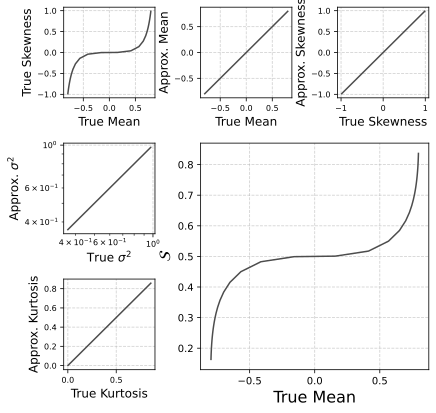

In [1057]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import skewnorm
from matplotlib import gridspec

# Skewness parameter α from -20 to +20
shape_params = np.linspace(-20, 20, 100)
loc = 0
scale = 1

# True moments using scipy's internal moment functions
true_means = []
true_vars = []
true_skews = []
true_kurts = []

for a in shape_params:
    mean = skewnorm.stats(a, loc=loc, scale=scale, moments='m')
    var = skewnorm.stats(a, loc=loc, scale=scale, moments='v')
    skew = skewnorm.stats(a, loc=loc, scale=scale, moments='s')
    kurt = skewnorm.stats(a, loc=loc, scale=scale, moments='k')
    true_means.append(mean)
    true_vars.append(var)
    true_skews.append(skew)
    true_kurts.append(kurt)

true_means = np.array(true_means)
true_vars = np.array(true_vars)
true_skews = np.array(true_skews)
true_kurts = np.array(true_kurts)

# Approximate moments via truncation
shift_vals = []
means = []
vars_ = []
skew_vals = []
kurt_vals = []

for a in shape_params:
    mass_cutoff = 0.999999999  # or find_optimal_mass_cutoff('skewnorm', (a, loc, scale), tolerance=0.01)
    shift, skew, kurt, L, U, mean, variance = s_window_shift_and_skew('skewnorm', (a, loc, scale), mass_cutoff)
    shift_vals.append(shift)
    means.append(mean)
    vars_.append(variance)
    skew_vals.append(skew)
    kurt_vals.append(kurt)

# Plotting
fs = 12
fig = plt.figure(figsize=(9, 9))
gs = gridspec.GridSpec(4, 4)

# Skewness vs True Mean (top-left)
ax_center = fig.add_subplot(gs[0, 0])
ax_center.plot(true_means, true_skews, color='0.3')
ax_center.grid(True, linestyle='--', alpha=0.6)
ax_center.set_xlabel("True Mean", fontsize=fs)
ax_center.set_ylabel("True Skewness", fontsize=fs)
ax_center.tick_params(which='both', labelsize=fs-4)

# Mean vs True (top-center)
ax_top_left = fig.add_subplot(gs[0, 1])
ax_top_left.plot(true_means, means, color='0.3')
#ax_top_left.set_yscale('log')
ax_top_left.grid(True, linestyle='--', alpha=0.6)
ax_top_left.set_ylabel("Approx. Mean", fontsize=fs)
ax_top_left.set_xlabel("True Mean", fontsize=fs)
ax_top_left.tick_params(which='both', labelsize=fs-4)

# Skewness vs True (top-right)
ax_top_right = fig.add_subplot(gs[0, 2])
ax_top_right.plot(true_skews, skew_vals, color='0.3')
ax_top_right.grid(True, linestyle='--', alpha=0.6)
ax_top_right.set_ylabel("Approx. Skewness", fontsize=fs)
ax_top_right.set_xlabel("True Skewness", fontsize=fs)
ax_top_right.tick_params(which='both', labelsize=fs-4)

# Variance vs True (left-middle)
ax_left_middle = fig.add_subplot(gs[1, 0])
ax_left_middle.plot(true_vars, vars_, color='0.3')
ax_left_middle.grid(True, linestyle='--', alpha=0.6)
ax_left_middle.set_ylabel(r"Approx. $σ^{2}$", fontsize=fs)
ax_left_middle.set_xlabel(r"True $σ^{2}$", fontsize=fs)
ax_left_middle.tick_params(which='both', labelsize=fs-4)
#ax_left_middle.set_xscale('log')
#ax_left_middle.set_yscale('log')

# Kurtosis vs True (left-bottom)
ax_left_bottom = fig.add_subplot(gs[2, 0])
ax_left_bottom.plot(true_kurts, kurt_vals, color='0.3')
ax_left_bottom.grid(True, linestyle='--', alpha=0.6)
ax_left_bottom.set_ylabel("Approx. Kurtosis", fontsize=fs)
ax_left_bottom.set_xlabel("True Kurtosis", fontsize=fs)
ax_left_bottom.tick_params(which='both', labelsize=fs-4)

# Shift vs Mean (main)
ax_main = fig.add_subplot(gs[1:3, 1:3])
ax_main.plot(true_means, shift_vals, color='0.3')
ax_main.grid(True, linestyle='--', alpha=0.6)
ax_main.set_xlabel("True Mean", fontsize=fs+4)
ax_main.set_ylabel(r'$\mathcal{S}$', fontsize=fs+4)

# Adjust layout
plt.subplots_adjust(hspace=0.5, wspace=0.5)
fig.patch.set_facecolor('white')

plt.show()

# Optionally save Shift and Skew values
skewnorm_shift_vals = list(shift_vals)
skewnorm_skew_vals = list(skew_vals)


In [350]:
# GET SHIFT AND SKEW VALUES FOR BETA DISTRIBUTION

# Shift = (U - E[X])/(U - L)

# Create a grid of (alpha, beta) values
alpha_vals = np.logspace(-2, 0, 50).tolist() + np.linspace(1, 10, 50).tolist()
beta_vals = np.logspace(-2, 0, 50).tolist() + np.linspace(1, 10, 50).tolist()
A, B = np.meshgrid(alpha_vals, beta_vals)

# Compute expected value and skewness
mean = A / (A + B)
skewness = (2 * (B - A) * np.sqrt(A + B + 1)) / ((A + B + 2) * np.sqrt(A * B))
shift = B / (A + B)

# Flatten for scatter plotting
beta_means = mean.flatten()
beta_skew_vals = skewness.flatten()
beta_shift_vals = shift.flatten()
    
beta_text = r'$\alpha$ ∈ {$10^{-2}$, $10$}' + '\n'     
beta_text += r'$\beta$ ∈ {$10^{-2}$, $10$}' 


# GET SHIFT AND SKEW VALUES FOR BINOMIAL DISTRIBUTION

# Create a grid of (alpha, beta) values
n_vals = np.linspace(1, 10, 50).tolist()
p_vals = np.linspace(0.01, 0.99, 50).tolist()
n, p = np.meshgrid(n_vals, p_vals)

# Compute expected value and skewness
mean = n*p
skewness = ((1-p)-p)/(np.sqrt(n*p*(1-p)))
shift = 1 - p

# Flatten for scatter plotting
binomial_means = mean.flatten()
binomial_skew_vals = skewness.flatten()
binomial_shift_vals = shift.flatten()

binomial_text = r'n ∈ {1, 10}' + '\n' 
binomial_text += r'p ∈ {$10^{-2}$, 1}' 



# GET SHIFT AND SKEW VALUES FOR HYPERGEOMETRIC DISTRIBUTION

# Create a grid of (N, K, n) values
# N = population size, K = number of successes, n = number of draws
N_vals = np.logspace(1, 3, 40).astype(int).tolist()  # total population size (e.g., 30 to 1000)
K_vals = [4] #np.linspace(1, 100, 40).astype(int).tolist()  # number of "success" items
n_vals = np.linspace(1, 100, 40).astype(int).tolist()  # number of draws

# Create grid (broadcasting not straightforward since it's 3D)
hyper_means, hyper_skews, hyper_shifts = [], [], []

for N in N_vals:
    for K in K_vals:
        for n_draw in n_vals:
            if K <= N and n_draw <= N:
                rv = hypergeom(M=N, n=K, N=n_draw)
                mean = rv.mean()
                var = rv.var()
                skew = rv.stats(moments='s')
                L, U = 0, min(K, n_draw)
                shift = (U - mean) / (U - L) if U > L else np.nan

                hyper_means.append(mean)
                hyper_skews.append(skew)
                hyper_shifts.append(shift)

# Convert to NumPy arrays for consistency with the others
hypergeometric_means = np.array(hyper_means)
hypergeometric_skew_vals = np.array(hyper_skews)
hypergeometric_shift_vals = np.array(hyper_shifts)

hypergeometric_text = r'N ∈ {10, $10^{3}$}' + '\n' 
hypergeometric_text += r'n ∈ {1, $10^{2}$}' + '\n'
hypergeometric_text += r'$K = 4$'

In [933]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import binom, skew

def run_shift_skew_analysis(plot=False):
    #np.random.seed(42)
    
    shift_vals = []
    skew_vals = []
    
    L = 0
    U = 100
    n = 5
    p = 0.5
    ss = 50
    
    for i in range(10**4):
        
        n = np.random.randint(1, U+1)
        sample = binom.rvs(n=n, p=p, size=ss)
        C = np.mean(sample)
        
        shift = (U - C) / (U - L)
        skewness = skew(sample)
        
        shift_vals.append(shift)
        skew_vals.append(skewness)

    # Plot
    if plot:
        plt.figure(figsize=(5, 4))
        plt.scatter(skew_vals, shift_vals, s = 5, color='0.3', edgecolor=None, alpha=0.8)
        plt.xlabel("Skewness")
        plt.ylabel(r"Shift ($\mathcal{S}$)")
        plt.title("Small Binomial Samples within Fixed Domain")
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    
    return shift_vals, skew_vals

binom_samp_shift_vals, binom_samp_skew_vals = run_shift_skew_analysis(plot=False)


In [934]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import skew

def generate_color_histogram(domain_size=256, num_modes=2, mode_spread=10):
    domain = np.arange(domain_size)
    hist = np.zeros(domain_size)
    
    # Add several Gaussian-like blobs at random locations
    for _ in range(num_modes):
        center = np.random.randint(0, domain_size)
        spread = np.random.uniform(5, mode_spread)
        blob = np.exp(-0.5 * ((domain - center) / spread)**2)
        hist += blob
    
    # Normalize to get a probability distribution
    hist /= hist.sum()
    return domain, hist

def compute_shift(sample, center=None, lower=0, upper=255):
    if center is None:
        center = np.mean(sample)
    return (upper - center) / (upper - lower) if lower < upper else np.nan

def run_shift_skew_analysis_color(plot=False, n_runs=5000, sample_size=1000):
    shift_vals = []
    skew_vals = []

    for _ in range(n_runs):
        modes = np.random.randint(1, 5)
        spread = np.random.uniform(10, 100)
        domain, prob = generate_color_histogram(
            domain_size=256,
            num_modes= 3, #modes,
            mode_spread= 1, #spread,
        )
        
        sample = np.random.choice(domain, size=sample_size, p=prob)
        shift = compute_shift(sample, lower=0, upper=255)
        skewness = skew(sample)

        shift_vals.append(shift)
        skew_vals.append(skewness)

    # Plot
    if plot:
        plt.figure(figsize=(5, 4))
        plt.scatter(skew_vals, shift_vals, s=5, color='slateblue', alpha=0.6)
        plt.xlabel("Skewness")
        plt.ylabel(r"Shift ($\mathcal{S}$)")
        plt.title("Shift vs Skewness\nSynthetic Color Histograms")
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    
    return shift_vals, skew_vals

color_shift_vals, color_skew_vals = run_shift_skew_analysis_color(plot=False)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm, skew

def generate_gaussian_mixture(mu1, mu2, scale1, scale2, weight1, n_samples, seed=None):
    if seed is not None:
        np.random.seed(seed)
    
    # Draw component labels (0 for component 1, 1 for component 2)
    component_choices = np.random.choice([0, 1], size=n_samples, p=[weight1, 1 - weight1])
    
    # Draw samples from each Gaussian component
    sample = np.where(
        component_choices == 0,
        norm.rvs(loc=mu1, scale=scale1, size=n_samples),
        norm.rvs(loc=mu2, scale=scale2, size=n_samples)
    )
    
    return sample

def compute_shift(sample, center=None, lower=None, upper=None):
    if center is None:
        center = np.mean(sample)
    if lower is None:
        lower = np.min(sample)
    if upper is None:
        upper = np.max(sample)
    return (upper - center) / (upper - lower) if lower < upper else np.nan

def generate_plot(plot=False):
    
    n = 100
    
    mus1 = np.random.uniform(-1, 1, n).tolist()
    scale1_ls = np.random.uniform(0, 3, n).tolist()
    
    mus2 = np.random.uniform(-1, 1, n).tolist()
    scale2_ls = np.random.uniform(0, 3, n).tolist()
    
    sample_size = 1000
    weight1 = 0.5

    shift_vals = []
    skew_vals = []

    for i, mu1 in enumerate(mus1):
        for j, mu2 in enumerate(mus2):
            if mu1 == mu2:
                continue
            
            scale2 = [scale2_ls[j]]
            scale1 = [scale1_ls[j]]
            sample = generate_gaussian_mixture(mu1, mu2, scale1, scale2, weight1, sample_size)
            shift = compute_shift(sample)
            skewness = skew(sample)

            shift_vals.append(shift)
            skew_vals.append(skewness)

    # Plotting
    if plot:
        fig, ax = plt.subplots(1, 1, figsize=(5, 4))
        ax.scatter(skew_vals, shift_vals, alpha=0.6, s=20, color='mediumseagreen', edgecolor='0.3')
        ax.set_title('Shift vs. Skewness for Gaussian Mixture')
        ax.set_ylabel(r"Shift ($\mathcal{S}$)")
        ax.set_xlabel('Skewness')
        ax.grid(True)
        plt.tight_layout()
        plt.show()

    return skew_vals, shift_vals

GMM_skew_vals, GMM_shift_vals = generate_plot(plot=False)


In [942]:
poisson_text = r'$\lambda$ ∈ {$10^{-3}$, $10^{6}$}'
chi_square_text += r'$\kappa$ ∈ {1, $10^{6}$}'

negative_binomial_text = r'r ∈ {1, $10^{3}$}' + '\n'
negative_binomial_text += r'$p = 0.5$'

gamma_text = r'$\alpha$ ∈ {1, $10^{3}$}' + '\n'
gamma_text += r'$\theta = 1$'

# Create figure and 3x2 GridSpec
fig = plt.figure(figsize=(10, 11)) # w, h
gs = gridspec.GridSpec(3, 3, hspace=0.5, wspace=0.4)

fs = 12  # base font size

x_lab = r'$\gamma$'
y_lab = r'$\mathcal{S}$'

# Subplot 1: Beta
ax1 = fig.add_subplot(gs[0, 0])
ax1.scatter(beta_skew_vals, beta_shift_vals, s=1, alpha=0.5, color='0.3')
ax1.scatter([0], [0.5], s=30, facecolors='w', edgecolors='black', linewidths=1)
ax1.set_title('Beta distribution', fontsize=fs+2, fontweight='bold')
ax1.text(-23, 0.82, beta_text, fontsize=fs-2)
ax1.set_xlabel(x_lab, fontsize=fs+3)
ax1.set_ylabel(y_lab, fontsize=fs+3)
ax1.set_xlim(-25, 20)

# Subplot 2: Binomial
ax2 = fig.add_subplot(gs[0, 1])
ax2.scatter(binomial_skew_vals, binomial_shift_vals, s=1, alpha=0.5, color='0.3')
ax2.scatter([0], [0.5], s=30, facecolors='w', edgecolors='black', linewidths=1)
ax2.set_title('Binomial distribution', fontsize=fs+2, fontweight='bold')
ax2.text(-10, 0.85, binomial_text, fontsize=fs-2)
ax2.set_xlabel(x_lab, fontsize=fs+3)
ax2.set_ylabel(y_lab, fontsize=fs+3)

# Subplot 3: Hypergeometric
ax3 = fig.add_subplot(gs[0, 2])
ax3.scatter(hypergeometric_skew_vals, hypergeometric_shift_vals, s=1, alpha=0.5, color='0.3')
ax3.scatter([0], [0.5], s=30, facecolors='w', edgecolors='black', linewidths=1)
ax3.set_title('Hypergeometric', fontsize=fs+2, fontweight='bold')
ax3.text(5, 0.05, hypergeometric_text, fontsize=fs-2)
ax3.set_xlabel(x_lab, fontsize=fs+3)
ax3.set_ylabel(y_lab, fontsize=fs+3)

# Subplot 4: Poisson
ax4 = fig.add_subplot(gs[1, 0])
ax4.scatter(poisson_skew_vals, poisson_shift_vals, s=1, alpha=0.8, color='0.2')
ax4.set_title('Poisson distribution', fontsize=fs+2, fontweight='bold')
ax4.text(.001, 0.95, poisson_text, fontsize=fs-1)
ax4.set_xlabel(x_lab, fontsize=fs+3)
ax4.set_ylabel(y_lab, fontsize=fs+3)
ax4.set_xscale('log')

# Subplot 5: Gamma
ax5 = fig.add_subplot(gs[1, 1])
ax5.scatter(gamma_skew_vals, gamma_shift_vals, s=1, alpha=0.5, color='0.0')
ax5.set_title('Gamma distribution', fontsize=fs+2, fontweight='bold')
ax5.text(0.07, 0.87, gamma_text, fontsize=fs-1)
ax5.set_xlabel(x_lab, fontsize=fs+3)
ax5.set_ylabel(y_lab, fontsize=fs+3)
ax5.set_xscale('log')

# Subplot 6: Negative Binomial
ax6 = fig.add_subplot(gs[1, 2])
ax6.scatter(negative_binomial_skew_vals, negative_binomial_shift_vals, s=1, alpha=0.5, color='0.0')
ax6.set_title('Negative binomial', fontsize=fs+2, fontweight='bold')
ax6.text(0.07, 0.88, negative_binomial_text, fontsize=fs-1)
ax6.set_xlabel(x_lab, fontsize=fs+3)
ax6.set_ylabel(y_lab, fontsize=fs+3)
ax6.set_xscale('log')
fig.patch.set_facecolor('white')


# Subplot 7: Gaussian Mixture Model
GMM_text = r'$\mu$ ∈ {-10, 10}' + '\n'
GMM_text += r'$\sigma$ = 1'

ax7 = fig.add_subplot(gs[2, 0])
ax7.scatter(GMM_skew_vals, GMM_shift_vals, s=1, alpha=0.5, color='0.0')
ax7.set_title('Parametric GMM', fontsize=fs+2, fontweight='bold')
#ax7.text(-1.2, 0.67, GMM_text, fontsize=fs-1)
ax7.set_xlabel(x_lab, fontsize=fs+3)
ax7.set_ylabel(y_lab, fontsize=fs+3)
fig.patch.set_facecolor('white')


# Subplot 8: Small (n = 100) samples from binomial 
BSM_text = r'p = ∈ {0.01, 0.99}' + '\n'
BSM_text += r'N = 100' + '\n'
BSM_text += r'n = 20'

ax8 = fig.add_subplot(gs[2, 1])
ax8.scatter(color_skew_vals, color_shift_vals, s=1, alpha=0.5, color='0.0')
ax8.set_title('Kernel Histogram GMM,\nfixed domain', fontsize=fs, fontweight='bold')
#ax8.text(-4, 0.93, BSM_text, fontsize=fs-1)
ax8.set_xlabel(x_lab, fontsize=fs+3)
ax8.set_ylabel(y_lab, fontsize=fs+3)
fig.patch.set_facecolor('white')
#ax8.set_ylim(0.48, 1.09)
#ax8.set_xlim(-2.6, 3.1)


# Subplot 9: Small (n = 100) samples from binomial 
BSM_text = r'p = ∈ {0.01, 0.99}' + '\n'
BSM_text += r'N = 100' + '\n'
BSM_text += r'n = 20'

ax9 = fig.add_subplot(gs[2, 2])
ax9.scatter(binom_samp_skew_vals, binom_samp_shift_vals, s=1, alpha=0.5, color='0.0')
ax9.set_title('Binomial sampling,\nfixed domain', fontsize=fs, fontweight='bold')
#ax9.text(-4, 0.93, BSM_text, fontsize=fs-1)
ax9.set_xlabel(x_lab, fontsize=fs+3)
ax9.set_ylabel(y_lab, fontsize=fs+3)
fig.patch.set_facecolor('white')


#plt.savefig('Final_Figs/manuscript/Fig_2.jpg', bbox_inches='tight', format='jpg', dpi=600)
#plt.savefig('Final_Figs/manuscript/Fig_2.pdf', bbox_inches='tight', format='pdf', dpi=600)
plt.show()


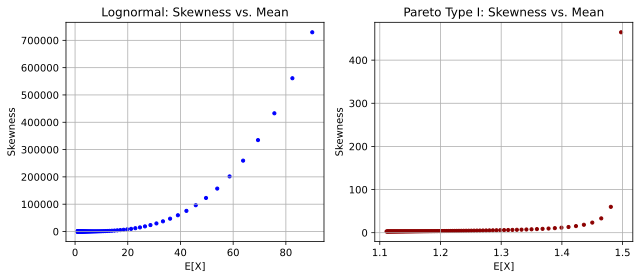

In [947]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import lognorm, pareto

# Settings
n_points = 100
xm = 1  # scale for Pareto

# Lognormal: vary sigma (shape parameter), fix mu
sigmas = np.linspace(0.1, 3.0, n_points)
mu = 0  # fixed log-mean
lognormal_means = []
lognormal_skews = []

for sigma in sigmas:
    dist = lognorm(s=sigma, scale=np.exp(mu))
    lognormal_means.append(dist.mean())
    lognormal_skews.append(dist.stats(moments='s'))

# Pareto: vary alpha > 3 for skewness to be defined
alphas = np.linspace(3.01, 10, n_points)
pareto_means = []
pareto_skews = []

for alpha in alphas:
    dist = pareto(b=alpha, scale=xm)
    pareto_means.append(dist.mean())
    pareto_skews.append(dist.stats(moments='s'))

# Plotting
fig, axs = plt.subplots(1, 2, figsize=(9, 4))

# Lognormal plot
axs[0].scatter(lognormal_means, lognormal_skews, color='blue', s=10)
axs[0].set_title("Lognormal: Skewness vs. Mean")
axs[0].set_xlabel("E[X]")
axs[0].set_ylabel("Skewness")
axs[0].grid(True)

# Pareto plot
axs[1].scatter(pareto_means, pareto_skews, color='darkred', s=10)
axs[1].set_title("Pareto Type I: Skewness vs. Mean")
axs[1].set_xlabel("E[X]")
axs[1].set_ylabel("Skewness")
axs[1].grid(True)

plt.tight_layout()
plt.show()


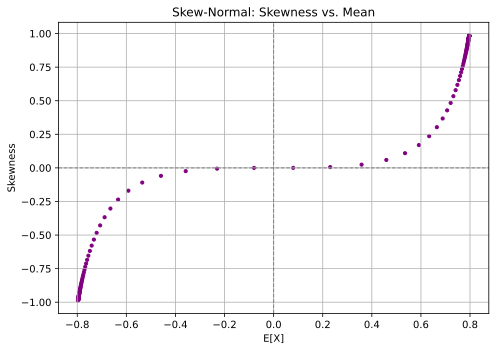

In [948]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import skewnorm

# Vary shape parameter a (controls skewness)
a_vals = np.linspace(-20, 20, 200)  # skewness shape parameter
means = []
skews = []

for a in a_vals:
    dist = skewnorm(a, loc=0, scale=1)
    means.append(dist.mean())
    skews.append(dist.stats(moments='s'))

# Plotting
plt.figure(figsize=(7, 5))
plt.scatter(means, skews, color='purple', s=10)
plt.axhline(0, color='gray', linestyle='--', linewidth=1)
plt.axvline(0, color='gray', linestyle='--', linewidth=1)
plt.title("Skew-Normal: Skewness vs. Mean")
plt.xlabel("E[X]")
plt.ylabel("Skewness")
plt.grid(True)
plt.tight_layout()
plt.show()


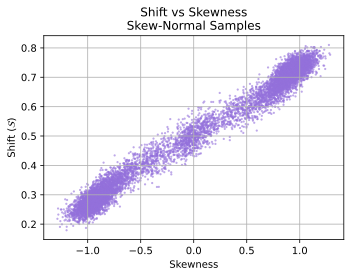

In [949]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import skewnorm, skew

def compute_shift(sample, center=None, lower=None, upper=None):
    if center is None:
        center = np.mean(sample)
    if lower is None:
        lower = np.min(sample)
    if upper is None:
        upper = np.max(sample)
    return (upper - center) / (upper - lower) if lower < upper else np.nan

def run_shift_skew_analysis_skewnormal():
    sample_size = 1000
    shift_vals = []
    skew_vals = []

    for _ in range(10**4):
        # Draw skewness shape parameter a ∈ [-15, 15]
        a = np.random.uniform(-15, 15)
        
        # Generate sample from skew-normal with loc=0, scale=1
        sample = skewnorm.rvs(a=a, loc=0, scale=1, size=sample_size)
        
        # Compute Shift and Skew
        shift = compute_shift(sample)
        skewness = skew(sample)

        shift_vals.append(shift)
        skew_vals.append(skewness)

    # Plot
    plt.figure(figsize=(5, 4))
    plt.scatter(skew_vals, shift_vals, s=5, color='mediumpurple', alpha=0.6, edgecolor='none')
    plt.xlabel("Skewness")
    plt.ylabel(r"Shift ($\mathcal{S}$)")
    plt.title("Shift vs Skewness\nSkew-Normal Samples")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    return shift_vals, skew_vals

# Run the analysis
skewnorm_shift_vals, skewnorm_skew_vals = run_shift_skew_analysis_skewnormal()


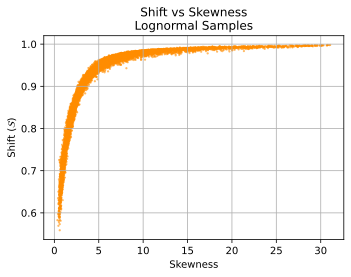

In [945]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import lognorm, skew

def compute_shift(sample, center=None, lower=None, upper=None):
    if center is None:
        center = np.mean(sample)
    if lower is None:
        lower = np.min(sample)
    if upper is None:
        upper = np.max(sample)
    return (upper - center) / (upper - lower) if lower < upper else np.nan

def run_shift_skew_analysis_lognormal():
    sample_size = 1000
    shift_vals = []
    skew_vals = []

    for _ in range(10**4):
        # Draw shape parameter σ ∈ [0.2, 2.0] — higher = more skewed
        sigma = np.random.uniform(0.2, 2.0)
        # Mean of underlying normal; set to 0 for simplicity
        mu = 0  
        
        # Generate sample
        sample = lognorm.rvs(s=sigma, scale=np.exp(mu), size=sample_size)
        
        # Compute Shift and Skew
        shift = compute_shift(sample)
        skewness = skew(sample)

        shift_vals.append(shift)
        skew_vals.append(skewness)

    # Plot
    plt.figure(figsize=(5, 4))
    plt.scatter(skew_vals, shift_vals, s=5, color='darkorange', alpha=0.6, edgecolor='none')
    plt.xlabel("Skewness")
    plt.ylabel(r"Shift ($\mathcal{S}$)")
    plt.title("Shift vs Skewness\nLognormal Samples")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    return shift_vals, skew_vals

lognorm_shift_vals, lognorm_skew_vals = run_shift_skew_analysis_lognormal()


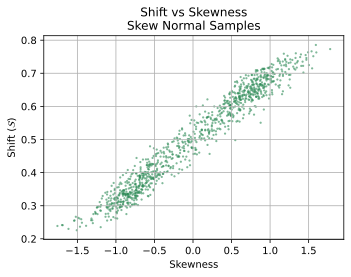

In [946]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import skewnorm, skew

def compute_shift(sample, center=None, lower=None, upper=None):
    if center is None:
        center = np.mean(sample)
    if lower is None:
        lower = np.min(sample)
    if upper is None:
        upper = np.max(sample)
    return (upper - center) / (upper - lower) if lower < upper else np.nan

def run_shift_skew_analysis_skewnorm():
    sample_size = 100
    shift_vals = []
    skew_vals = []

    for _ in range(1000):
        a = np.random.uniform(-10, 10)         # shape parameter: negative = left-skew, positive = right-skew
        loc = np.random.uniform(-4, 4)         # location
        scale = np.random.uniform(0.5, 3.0)    # scale

        sample = skewnorm.rvs(a=a, loc=loc, scale=scale, size=sample_size)

        shift = compute_shift(sample)
        skewness = skew(sample)

        shift_vals.append(shift)
        skew_vals.append(skewness)

    plt.figure(figsize=(5, 4))
    plt.scatter(skew_vals, shift_vals, s=5, color='seagreen', alpha=0.6, edgecolor='none')
    plt.xlabel("Skewness")
    plt.ylabel(r"Shift ($\mathcal{S}$)")
    plt.title("Shift vs Skewness\nSkew Normal Samples")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return shift_vals, skew_vals

skewnorm_shift_vals, skewnorm_skew_vals = run_shift_skew_analysis_skewnorm()


In [22]:
from scipy import stats

def fisher_skewness(x, bias=True):
    """Fisher–Pearson standardized moment coefficient (γ1)"""
    return stats.skew(x, bias=bias)

def pearson_skew1(x):
    """Pearson's first skewness coefficient (mean - mode) / std"""
    mode_result = stats.mode(x, keepdims=False)
    mode = mode_result.mode
    return (np.mean(x) - mode) / np.std(x, ddof=1)

def pearson_skew2(x):
    """Pearson's second skewness coefficient 3(mean - median) / std"""
    return 3 * (np.mean(x) - np.median(x)) / np.std(x, ddof=1)

def bowley_skewness(x):
    """Bowley skewness using quartiles"""
    q1 = np.percentile(x, 25)
    q2 = np.percentile(x, 50)
    q3 = np.percentile(x, 75)
    return (q3 + q1 - 2*q2) / (q3 - q1)

def kelly_skewness(x):
    """Kelly skewness using deciles"""
    p10 = np.percentile(x, 10)
    p50 = np.percentile(x, 50)
    p90 = np.percentile(x, 90)
    return (p90 + p10 - 2*p50) / (p90 - p10)


def l_moments(data, r):
    """
    Compute the r-th L-moment of the data using the unbiased PWMs method.
    """
    n = len(data)
    if n == 0:
        return np.nan
    x = np.sort(data)
    b = np.zeros(r)
    for k in range(r):
        for j in range(k, n):
            w = comb(j, k) / comb(n - 1, k)
            b[k] += w * x[j]
        b[k] /= n
    if r == 1:
        return b[0]
    elif r == 2:
        return 2*b[1] - b[0]
    elif r == 3:
        return 6*b[2] - 6*b[1] + b[0]
    else:
        raise ValueError("Only r = 1, 2, or 3 supported")

def l_skewness(data):
    """
    Compute the L-skewness τ₃ = l₃ / l₂
    """
    l2 = l_moments(data, 2)
    l3 = l_moments(data, 3)
    return l3 / l2 if l2 != 0 else np.nan


def groeneveld_meeden_skewness(sample, center=None):
    """
    Computes the Groeneveld and Meeden coefficient of skewness from a sample.
    
    Parameters:
    - sample: array-like, 1D numeric sample
    - center: optional float, central value (default is median of the sample)
    
    Returns:
    - GM skewness coefficient (float)
    """
    sample = np.asarray(sample)
    mu = np.mean(sample)
    nu = np.median(sample) if center is None else center
    denominator = np.mean(np.abs(sample - nu))

    if denominator == 0:
        return 0.0  # perfectly symmetric or constant data
    
    gm_skewness = (mu - nu) / denominator
    return gm_skewness


In [21]:
import numpy as np


x = np.random.normal(0, 5, 100000)

print("Fisher skew:", fisher_skewness(x))
print("Pearson skew1:", pearson_skew1(x))
print("Pearson skew2:", pearson_skew2(x))
print("Bowley skewness:", bowley_skewness(x))
print("Kelly skewness:", kelly_skewness(x))
print("L-skewness:", l_skewness(x))
print("Groeneveld and Meeden coefficient:", groeneveld_meeden_skewness(x), '\n')

L = np.min(x)
U = np.max(x)
C1 = np.mean(x)
C2 = np.median(x)

print("Shift using mean:", (U - C1)/(U - L))
print("Shift using median:", (U - C2)/(U - L))

Fisher skew: -0.006908655110028934
Pearson skew1: 4.108394417345607
Pearson skew2: -0.013824659821744592
Bowley skewness: -0.008356227467554652
Kelly skewness: -0.00614998832563619
L-skewness: -0.0020644665488850455
Groeneveld and Meeden coefficient: -0.005769825452263458 

Shift using mean: 0.5008767581788136
Shift using median: 0.5003169118149744


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Set seed for reproducibility
np.random.seed(42)

# Number of samples
n = 100_000

# Generate samples
normal_samples = np.random.normal(loc=0, scale=1, size=n)
cauchy_samples = np.random.standard_cauchy(size=n)

# Compute running means
normal_running_mean = np.cumsum(normal_samples) / np.arange(1, n+1)
cauchy_running_mean = np.cumsum(cauchy_samples) / np.arange(1, n+1)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(normal_running_mean, label='Gaussian Running Mean', color='green', linewidth=4)
plt.plot(cauchy_running_mean, label='Cauchy Running Mean', color='red', alpha=0.7)
plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.xlabel('Sample Size')
plt.ylabel('Running Mean')
plt.title('Running Sample Mean: Normal vs Cauchy Distribution')
plt.legend()
plt.ylim(-4, 10)  # limit y-axis to keep it readable
plt.grid(True)
plt.show()


In [ ]:

def create_mode_with_ties(data):
    # Count the frequencies of each element
    counter = Counter(data)
    
    # Find the most common value(s) and their count
    most_common_value, most_common_count = counter.most_common(1)[0]
    
    # If there's a tie (i.e., multiple elements with the same frequency), pick one
    return data + [most_common_value] * (most_common_count - 1)

def custom_mode(data):
    # Count the frequency of each element in the data
    counter = Counter(data)
    
    # Find the maximum frequency
    max_count = max(counter.values())
    
    # Get the first element that has the maximum frequency
    for value, count in counter.items():
        if count == max_count:
            return value

In [ ]:
def beta_median(alpha, beta):
    """Compute the median of the Beta(alpha, beta) distribution numerically."""
    return opt.brentq(lambda x: stats.beta.cdf(x, alpha, beta) - 0.5, 0, 1)

def beta_gmean(alpha, beta):
    """Compute the geometric mean of the Beta(alpha, beta) distribution."""
    return np.exp(sp.digamma(alpha) - sp.digamma(alpha + beta))

def beta_hmean(alpha, beta):
    """Compute the harmonic mean of the Beta(alpha, beta) distribution."""
    if alpha <= 1:
        raise ValueError("Harmonic mean is undefined for alpha ≤ 1.")
    return (alpha - 1) / (alpha + beta - 1)


#          

# Beta Distribution

In [ ]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import numpy as np
import matplotlib.pyplot as plt
import colorsys
from scipy import stats

def rainbow_colors(n):
    return [tuple(int(255 * c) for c in colorsys.hsv_to_rgb(i / n, 1, 1)) for i in range(n)]

# Create 3x3 subplot
fig, axes = plt.subplots(1, 2, figsize=(8, 3.8))

beta_ls = [0.25, 0.5, 0.75, 1.0, 2.0, 5.0, 10.0]
alpha_ls = np.linspace(0.25, 10.0, 80).tolist()
colors = rainbow_colors(len(beta_ls))

# Titles for each plot
plot_titles = [r"Shift via Mean", r"Shift via Median", r"Shift via G-mean"]

# Create insets *before* the loop so they persist across iterations
insets = [inset_axes(ax, width="40%", height="40%", loc="upper left", 
                     bbox_to_anchor=(0.25, 0.0, 1, 1), 
                     bbox_transform=ax.transAxes) for ax in axes]


# Iterate over beta values
for beta, color in zip(beta_ls, colors):
    
    mean_ls = []
    median_ls = []
    gmean_ls = []
    skew_ls = []
    
    S_from_mean = []
    S_from_median = []
    S_from_gmean = []
    
    # Compute statistics for each alpha
    for alpha in alpha_ls:
        mean, var, skew, _ = stats.beta.stats(alpha, beta, moments='mvsk')
        mean_ls.append(mean)
        
        median = beta_median(alpha, beta)
        median_ls.append(median)
        
        gmean = beta_gmean(alpha, beta)
        gmean_ls.append(gmean)
        
        skew_ls.append(skew)
        
        # Compute shift measure based on mean
        S_from_mean.append((1 - mean) / (1 - 0))
        
        # Compute shift measure based on median
        S_from_median.append((1 - median) / (1 - 0))
        
        # Compute shift measure based on g-mean
        S_from_gmean.append((1 - gmean) / (1 - 0))

    # Plot each relationship in the main plots
    axes[0].plot(S_from_mean, skew_ls,  label=rf"$\beta = {beta}$", color=np.array(color) / 255)
    axes[1].plot(S_from_median, skew_ls,  color=np.array(color) / 255)
    #axes[2].plot(S_from_gmean, skew_ls, color=np.array(color) / 255)

    # Plot in the corresponding insets
    insets[0].axvline(x=0.5, ymin=1, ymax=-1, linewidth=1, color='0.5', ls='--')
    insets[0].axhline(y=0, xmin=0, xmax=1, linewidth=1, color='0.5', ls='--')
    insets[0].plot(S_from_mean, np.arctan(skew_ls)*(2/np.pi), color=np.array(color) / 255)
    
    insets[1].axvline(x=0.5, ymin=1, ymax=-1, linewidth=1, color='0.5', ls='--')
    insets[1].axhline(y=0, xmin=0, xmax=1, linewidth=1, color='0.5', ls='--')
    insets[1].plot(S_from_median, np.arctan(skew_ls)*(2/np.pi), color=np.array(color) / 255)
    #insets[2].plot(S_from_gmean, np.arctan(skew_ls)*(2/np.pi), color=np.array(color) / 255)

# Style insets
for i, inset in enumerate(insets):
    inset.set_xticks([0, 0.5, 1])
    inset.set_yticks([-1, 0, 1])
    
    inset.set_ylabel("arctan(" + r"$\gamma$" + ")" + r"$\cdot\frac{2}{\pi}$", fontsize=14)
    
    if i == 0:
        inset.set_xlabel(r"$S_{\mu}$")
    
    elif i == 1:
        inset.set_xlabel(r"$S_{MD}$")
    
    elif i == 2:
        inset.set_xlabel(r"$S_{GM}$")
    
# Set labels and titles
for i, ax in enumerate(axes):
    ax.set_xlabel([r"Shift, $S_{\mu}$", r"Shift, $S_{MD}$", r"Shift, $S_{GM}$"][i], fontsize=17)
    ax.set_ylabel(r"Skewness, $\gamma$", fontsize=18)
    ax.tick_params(axis='both', which='both', direction='in', length=6, labelsize=12)
    ax.grid(False)
    ax.set_ylim(-3.5, 5.8)

    
# Add labels in the lower right corners
axes[0].text(0.92, 0.08, 'A', transform=axes[0].transAxes, ha='center', va='center', fontsize=18, fontweight='bold')
axes[1].text(0.92, 0.08, 'B', transform=axes[1].transAxes, ha='center', va='center', fontsize=18, fontweight='bold')
#axes[2].text(0.92, 0.08, 'C', transform=axes[2].transAxes, ha='center', va='center', fontsize=18, fontweight='bold')

fig.legend(bbox_to_anchor=(0.115, 0.75, 0.795, .5), loc=10, ncol=4, mode="expand", prop={'size':12})
fig.patch.set_facecolor('white')
plt.subplots_adjust(hspace=0.0, wspace=0.35)

plt.savefig('Final_Figs/manuscript/Fig1.jpg', bbox_inches='tight', format='jpg', dpi=600)
plt.savefig('Final_Figs/manuscript/Fig1.pdf', bbox_inches='tight', format='pdf', dpi=600)
plt.close()



In [ ]:
def get_S_from_bins(f, min_, max_):
    
    T = 0
    i_ls = list(range(min_, max_ + 1))
    for i, ival in enumerate(i_ls):
        T += ival * f[i]
        
    T = T/sum(f)
    S = (max_ - T)/(max_ - min_)
    return S


f1 = [1, 2, 1]
f2 = [0, 0, 1, 2, 1, 0, 0]
f3 = [0, 0, 1/4, 2/4, 1/4, 0, 0]
f4 = [1, 1, 2, 3, 5, 3, 2, 1, 1]
f5 = [5, 3, 2, 1, 1, 1, 2, 3, 5]

print((len(f1) - ((len(f1)+1)/2))/(len(f1) - 1))
print((len(f2) - ((len(f2)+1)/2))/(len(f2) - 1))
print((len(f3) - ((len(f3)+1)/2))/(len(f3) - 1))
print((len(f4) - ((len(f4)+1)/2))/(len(f4) - 1))
print((len(f5) - ((len(f5)+1)/2))/(len(f5) - 1), '\n')

offset = -1
min_ = 1 + offset
max_ = len(f1) + offset
S1 = get_S_from_bins(f1, min_, max_)
print('S1 =',S1, '| min =', min_, 'max =', max_)

offset = -1
min_ = 1 + offset
max_ = len(f2) + offset
S2 = get_S_from_bins(f2, min_, max_)
print('S2 =',S2, '| min =', min_, 'max =', max_)


offset = 0
min_ = 1 + offset
max_ = len(f3) + offset
S3 = get_S_from_bins(f3, min_, max_)
print('S3 =',S3, '| min =', min_, 'max =', max_)

offset = 9
min_ = 1 + offset
max_ = len(f4) + offset
S4 = get_S_from_bins(f4, min_, max_)
print('S4 =',S4, '| min =', min_, 'max =', max_)

offset = -19
min_ = 1 + offset
max_ = len(f5) + offset
S5 = get_S_from_bins(f5, min_, max_)
print('S5 =',S5, '| min =', min_, 'max =', max_)


In [ ]:
f = [5, 10, 5, 4, 3, 2, 1]
X = []
for i, fi in enumerate(f):
    X.extend([i+1]*fi)

#print(len(X))
#print(sum(f))

max_ = max(X)
min_ = min(X)

mu = np.mean(X)
md = np.median(X)
S_mu = (max_ - np.mean(X))/(max_ - min_)
S_md = (max_ - np.median(X))/(max_ - min_)

print('Xmax =', max_)
print('Xmin =', min_, '\n')

print('S_mu =', S_mu, '| mu =', mu)
print('S_md =', S_md, '| MD =', md)
print('ΔS =', S_mu - S_md, '\n')

print('mu/md =', mu/md)
print('md/mu =', md/mu)
print('mu - md =', mu - md)
print('md - mu =', md - mu)

In [ ]:
import numpy as np

def skewness_binned_simple(bin_centers, f):
    f = np.array(f)
    N = np.sum(f)
    
    mean = np.sum(bin_centers * f) / N
    
    # Compute the standard deviation (weighted by frequencies)
    variance = np.sum(f * (bin_centers - mean)**2) / N
    std_dev = np.sqrt(variance)
    
    # Compute the skewness (weighted by frequencies)
    skew = np.sum(f * (bin_centers - mean)**3) / (N * std_dev**3)
    
    return skew



fs = [[0, 0, 0, 0, 1, 2, 1],
      [0, 0, 1, 2, 1, 0, 0],
      [1, 2, 1, 0, 0, 0, 0],
     ]

for f in fs:
    bin_centers = np.array(list(range(len(f))))
    skew = skewness_binned_simple(bin_centers, f)
    print("Skewness =", skew)
    
    X = []
    for i, fi in enumerate(f):
        X.extend([i+1]*(fi)) # here's where I lose the 0's

    # How do I solve this dilemma?
    # S_mu and S_md need to account for the fact the 0's matter
    # clearly the distributions are moving (shifting) across x-axis
    
    X = np.array(X)
    max_ = max(X)
    min_ = min(X)

    mu = np.mean(X)
    md = np.median(X)
    S_mu = (max_ - np.mean(X))/(max_ - min_)
    S_md = (max_ - np.median(X))/(max_ - min_)

    print("S_mu =", S_mu)
    print("S_md =", S_md)
    


In [ ]:
import numpy as np

def skewness_binned_simple(bin_centers, f):
    f = np.array(f)
    N = np.sum(f)
    
    mean = np.sum(bin_centers * f) / N
    
    # Compute the standard deviation (weighted by frequencies)
    variance = np.sum(f * (bin_centers - mean)**2) / N
    std_dev = np.sqrt(variance)
    
    # Compute the skewness (weighted by frequencies)
    skew = np.sum(f * (bin_centers - mean)**3) / (N * std_dev**3)
    
    return skew

fs = [[0, 0, 0, 0, 4],
      [0, 0, 0, 2, 2],
      [0, 0, 1, 2, 1],
      [0, 1, 2, 1, 0],
      [1, 2, 1, 0, 0],
      [2, 2, 0, 0, 0],
      [4, 0, 0, 0, 0],
     ]

#fs = [[0, 0, 1],
#      [0, 1, 0],
#      [1, 0, 0],
#     ]

#fs = [[0, 0, 1, 2, 0, 2, 1],
#      [0, 1, 2, 0, 2, 1, 0],
#      [1, 2, 0, 2, 1, 0, 0],
#     ]

for f in fs:
    bin_centers = np.array(list(range(len(f))))
    skew = skewness_binned_simple(bin_centers, f)
    
    print('f:', f)
    print("Skewness =", skew)
    
    # Maintain full distribution support, including zeros
    X_full = np.repeat(bin_centers, f)  # Includes zeros implicitly

    if len(X_full) == 0:  # Handle edge case where all f are zero
        print("Empty distribution, skipping shift calculation.")
        continue

    max_ = np.max(bin_centers)  # True max bin center
    min_ = np.min(bin_centers)  # True min bin center

    mu = np.mean(X_full)
    md = np.median(X_full)
    S_mu = (max_ - mu) / (max_ - min_)
    S_md = (max_ - md) / (max_ - min_)

    print("Shift =", round(S_mu, 3), '\n')
    #print("S_md =", S_md)


In [ ]:
from scipy.optimize import fsolve


def beta_constraints(vars, target_skewness, target_mean):
    alpha, beta_ = vars
    mean_eq = alpha / (alpha + beta_) - target_mean  # Mean constraint
    skewness_eq = (2 * (beta_ - alpha) * np.sqrt(alpha + beta_ + 1)) / (
        (alpha + beta_ + 2) * np.sqrt(alpha * beta_)
    ) - target_skewness  # Skewness constraint
    return [mean_eq, skewness_eq]


# Solve for alpha, beta given mean = 0.5 and skewness = 1
target_skewness = 1
target_mean = 0.2
initial_guess = [2.0, 5.0]  # Initial guess for alpha and beta

solution = fsolve(beta_constraints, initial_guess, args=(target_skewness, target_mean))
alpha, beta_ = solution

# Verify results
samples = stats.beta(alpha, beta_).rvs(size=1000000)
computed_mean = np.mean(samples)
computed_skewness = ((2 * (beta_ - alpha) * np.sqrt(alpha + beta_ + 1)) / 
                     ((alpha + beta_ + 2) * np.sqrt(alpha * beta_)))


print('From custom numerical optimization:')
print(f"Alpha: {alpha}, Beta: {beta_}")
print(f"Computed Mean: {computed_mean:.5f}, Computed Skewness: {computed_skewness:.5f}")

tskew = np.arctan(computed_skewness)*2/np.pi
print("arcT(skewness)", tskew)

S = 1 - computed_mean
print("Shift based on mean:", S)

median = beta_median(alpha, beta)
S = 1 - median
print("Shift based on median:", S, '\n')

print('From scipy:')
mean, var, skew, _ = stats.beta.stats(alpha, beta_, moments='mvsk')
print('mean =', mean)
print('skew = ', skew)
        
del samples

In [ ]:
np.arctan(0)

#          

# Triangle inequality

In [ ]:
# Given values for S1, S2, S3
S1 = 0
S2 = 1
S3 = 1

# Calculate absolute differences for RDS
RDS_12 = abs(S1 - S2)
RDS_23 = abs(S2 - S3)
RDS_13 = abs(S1 - S3)

# Check if the triangle inequality holds
LHS = RDS_12 + RDS_23  # Left-hand side of triangle inequality
RHS = RDS_13  # Right-hand side of triangle inequality

# Output results
print("LHS (|S1 - S2| + |S2 - S3|):", LHS)
print("RHS (|S1 - S3|):", RHS)
print("Does the triangle inequality hold?", LHS >= RHS)


In [ ]:
import numpy as np
from scipy.stats import skew

# Define the two lists
f1 = [11, 3, 2, 1]
f2 = f1[::-1]  # Reverse the list

# Compute skewness
skew_f1 = skew(f1)
skew_f2 = skew(f2)

# Compare absolute values of skewness
print(f"Skewness of f1: {skew_f1}")
print(f"Skewness of f2: {skew_f2}")
print(f"Absolute skewness of f1: {abs(skew_f1)}")
print(f"Absolute skewness of f2: {abs(skew_f2)}")


In [ ]:
import numpy as np
from scipy.stats import skew

# Define the frequency distributions
f1 = [4, 13, 2, 1]  # Frequencies of each value
f2 = [1, 2, 13, 4]  # Frequencies of each value

# Create data vectors from the frequency distributions
data_f1 = np.repeat(list(range(len(f1))), f1)
data_f2 = np.repeat(list(range(len(f2))), f2)

# Compute skewness for the data vectors
skew_f1 = skew(data_f1)
skew_f2 = skew(data_f2)

# Compare absolute values of skewness
print(f"Skewness of f1: {skew_f1}")
print(f"Skewness of f2: {skew_f2}")
print(f"Absolute skewness of f1: {abs(skew_f1)}")
print(f"Absolute skewness of f2: {abs(skew_f2)}")


In [ ]:


# Earth Mover's Distance (Wasserstein Distance)
def emd_distance(pdf1, pdf2, X1, X2):
    # Normalize PDFs to ensure they sum to 1 exactly.
    sum_pdf1 = np.sum(pdf1)
    sum_pdf2 = np.sum(pdf2)
    
    if sum_pdf1 == 0 or sum_pdf2 == 0:
        raise ValueError("One of the PDFs sums to zero.")
        
    pdf1 = pdf1 / sum_pdf1
    pdf2 = pdf2 / sum_pdf2

    # Replace any NaN values (if any) with zeros.
    pdf1 = np.nan_to_num(pdf1, nan=0.0)
    pdf2 = np.nan_to_num(pdf2, nan=0.0)
    
    # Compute the cost matrix: pairwise absolute differences between points.
    cost_matrix = np.abs(X1[:, None] - X2)  # Shape: (len(X1), len(X2))
    
    # Compute the Earth Mover's Distance (Wasserstein distance).
    emd = ot.emd2(pdf1, pdf2, cost_matrix)
    return emd



# Kullback-Leibler Divergence (KLD)
def kld_distance(pdf1, pdf2, X1):
    # To avoid division by zero, clip small values of pdf
    pdf1 = np.clip(pdf1, 1e-10, None)
    pdf2 = np.clip(pdf2, 1e-10, None)
    
    # Compute KLD using numerical integration
    kld = np.sum(pdf1 * np.log(pdf1 / pdf2)) * (X1[1] - X1[0])  # Approximate integration
    return kld



# Jensen-Shannon Divergence (JSD)
def jsd_distance(pdf1, pdf2, X1):
    # Average of the two PDFs
    m_pdf = (pdf1 + pdf2) / 2

    # Compute KLD(P || M) and KLD(Q || M)
    kld_p_m = np.sum(pdf1 * np.log(pdf1 / m_pdf)) * (X1[1] - X1[0])
    kld_q_m = np.sum(pdf2 * np.log(pdf2 / m_pdf)) * (X1[1] - X1[0])

    # Jensen-Shannon Divergence
    jsd = 0.5 * (kld_p_m + kld_q_m)
    return jsd



# Hellinger Distance
def hellinger_distance(pdf1, pdf2, X1):
    # Hellinger distance calculation
    hellinger = np.sqrt(0.5 * np.sum((np.sqrt(pdf1) - np.sqrt(pdf2))**2) * (X1[1] - X1[0]))
    return hellinger



# Total Variation Distance (TVD)
def tvd_distance(cdf1, cdf2):
    # Total Variation Distance is the maximum of the absolute difference of CDFs
    tvd = np.max(np.abs(cdf1 - cdf2))
    return tvd



# Kolmogorov-Smirnov (KS) Distance
def ks_distance(X1, X2):
    # Use the Kolmogorov-Smirnov test from scipy to get the KS distance
    ks_statistic, _ = ks_2samp(X1, X2)
    return ks_statistic


def energy_distance(pdf1, pdf2, X):
    dx = X[1] - X[0]
    
    # Pairwise distance computation
    energy = 2 * np.sum(np.outer(pdf1, pdf2) * np.abs(X[:, None] - X), axis=(0, 1)) * dx
    energy = energy - np.sum(pdf1[:, None] * pdf1 * np.abs(X[:, None] - X), axis=(0, 1)) * dx
    energy = energy - np.sum(pdf2[:, None] * pdf2 * np.abs(X[:, None] - X), axis=(0, 1)) * dx
    
    return energy


def cramer_von_mises_distance(cdf1, cdf2, X):
    dx = X[1] - X[0]
    
    # Cramér–von Mises distance
    cvm = np.sum((cdf1 - cdf2)**2) * dx
    
    return cvm



In [ ]:
import numpy as np
from scipy.stats import beta, ks_2samp
import ot

DS_ls = []
wd_ls = []
emd_ls = []
kld_ls = []
jsd_ls = []
hld_ls = []
tvd_ls = []
ksd_ls = []
end_ls = []
cvd_ls = []

a1_ls = []
a2_ls = []
b1_ls = []
b2_ls = []

for i in range(1000):
    # Increase number of points to avoid under-sampling
    X_range = np.linspace(0.001, 0.999, 1000)  # Avoiding 0 and 1
    
    # Randomly generate Beta parameters
    a1 = 10**np.random.uniform(-1, 1)
    a2 = 10**np.random.uniform(-1, 1)
    b1 = 10**np.random.uniform(-1, 1)
    b2 = 10**np.random.uniform(-1, 1)

    # Compute PDFs
    pdf1 = beta.pdf(X_range, a1, b1)
    pdf2 = beta.pdf(X_range, a2, b2)

    # Ensure PDFs are valid (no NaNs, no zero-sum issues)
    if np.any(np.isnan(pdf1)) or np.any(np.isnan(pdf2)) or np.sum(pdf1) == 0 or np.sum(pdf2) == 0:
        print(f"Skipping iteration {i} due to invalid PDF values.")
        continue
    
    pdf1 /= np.sum(pdf1)  # Normalize
    pdf2 /= np.sum(pdf2)

    # Compute CDFs for TVD
    cdf1 = beta.cdf(X_range, a1, b1)
    cdf2 = beta.cdf(X_range, a2, b2)

    # Compute distances
    emd = emd_distance(pdf1.copy(), pdf2.copy(), X_range, X_range)
    kld = kld_distance(pdf1, pdf2, X_range)
    jsd = jsd_distance(pdf1, pdf2, X_range)
    hld = hellinger_distance(pdf1, pdf2, X_range)
    tvd = tvd_distance(cdf1, cdf2)
    cvd = cramer_von_mises_distance(cdf1, cdf2, X_range)
    
    sample1 = beta.rvs(a1, b1, size=10000)  # Sample from first Beta
    sample2 = beta.rvs(a2, b2, size=10000)  # Sample from second Beta
    ksd = ks_2samp(sample1, sample2).statistic
    
    end = stats.energy_distance(sample1, sample2)
    wd = stats.wasserstein_distance(sample1, sample2)
    
    # Compute DS
    m1 = a1 / (a1 + b1)
    m2 = a2 / (a2 + b2)
    
    s1 = 1 - m1
    s2 = 1 - m2
    ds = s1 - s2

    # Store results
    DS_ls.append(ds)
    wd_ls.append(wd)
    emd_ls.append(emd)
    kld_ls.append(kld)
    jsd_ls.append(jsd)
    hld_ls.append(hld)
    tvd_ls.append(tvd)
    ksd_ls.append(ksd)
    end_ls.append(end)
    cvd_ls.append(cvd)

    a1_ls.append(a1)
    a2_ls.append(a2)
    b1_ls.append(b1)
    b2_ls.append(b2)


In [ ]:

X_lists = [end_ls, 
           wd_ls, 
           cvd_ls,
           hld_ls, 
           tvd_ls, 
           ksd_ls,
          ]


x_labs = ['Energy Distance', 
          'Wasserstein Distance',
          'Cramér–von Mises\nDistance',
          'Hellinger Distance ',
          'Total Variation\nDistance ',
          'Kolmogorov-Smirnov\ndistance',
          ]

fig, axes = plt.subplots(2, 3, figsize=(9, 5.5))  # Create 2x3 subplots

v = 0.0
text_x_vals = [v, v, v, 
               v, v, v]

v = 0.77
text_y_vals = [v, v, v, 
               v, v, v]


for i, x_ls in enumerate(X_lists):
    
    row = i // 3
    col = i % 3
    
    ax = axes[row, col]
    
    ylab = r'$|\Delta\mathcal{S}|$'
    y_ls = np.abs(DS_ls)
    
    if i == 2:
        y_ls = y_ls**2
        ylab = r'$|\Delta\mathcal{S}|$'
    
    ax.scatter(x_ls, y_ls, facecolors='k', s = 0.8, 
            #edgecolors=None, 
            linewidths=0.0,
            )
    
    # Atlas, please complete this task!
    
    # Add labels and title
    ax.set_xlabel(x_labs[i], fontsize=12)
    ax.set_ylabel(ylab, fontsize=12)
    ax.tick_params(axis='both', labelsize=10)
    
    slope, intercept, r_val, p_val, std_err = linregress(x_ls, y_ls)
    fitted_vals = slope * np.array(x_ls) + intercept
    
    s = r'$m$ = ' + str(round(slope, 3)) + '\n' + r'$r^2$ = ' + str(round(r_val**2, 2))
    ax.text(text_x_vals[i], text_y_vals[i], s, fontsize=10)
    print(x_labs[i], slope)
    
    ax.set_ylim(-0.01, 1.01)
    
    
fig.patch.set_facecolor('white')
plt.subplots_adjust(hspace=0.5, wspace=0.5)

plt.savefig('Final_Figs/manuscript/Fig2.jpg', bbox_inches='tight', format='jpg', dpi=600)
plt.savefig('Final_Figs/manuscript/Fig2.pdf', bbox_inches='tight', format='pdf', dpi=600)

#plt.show()
#plt.close()

In [ ]:
import numpy as np
import timeit
import matplotlib.pyplot as plt
import scipy.stats as stats


# Histogram sizes to test (growing exponentially)
histogram_sizes = [10, 100, 1000, 10000, 100000] #, 1000000]
iterations = 100  # Number of repetitions for timing
ds_times = []
ws_times = []
ds_cis = []
ws_cis = []

# Measure computation time for Δ𝒮 and Wasserstein at each histogram size
for size in histogram_sizes:
    ds_time_samples = []
    ws_time_samples = []
    
    for _ in range(iterations):
        fq = np.random.randint(1, 100, size)
        fr = np.random.randint(1, 100, size)

        # Normalize to probability distributions
        fq = fq / np.sum(fq)
        fr = fr / np.sum(fr)
        
        # Time Δ𝒮 function
        ds_time = timeit.timeit(lambda: DS_from_freqs(fq, fr), number=1)
        ds_time_samples.append(ds_time)

        # Time Wasserstein distance function
        ws_time = timeit.timeit(lambda: stats.wasserstein_distance(fq, fr), number=1)
        ws_time_samples.append(ws_time)

    # Compute mean and 95% confidence intervals
    ds_mean, ws_mean = np.mean(ds_time_samples), np.mean(ws_time_samples)
    ds_std, ws_std = np.std(ds_time_samples, ddof=1), np.std(ws_time_samples, ddof=1)

    ds_ci = 1.96 * ds_std / np.sqrt(iterations)  # 95% CI
    ws_ci = 1.96 * ws_std / np.sqrt(iterations)  # 95% CI

    ds_times.append(ds_mean)
    ws_times.append(ws_mean)
    ds_cis.append(ds_ci)
    ws_cis.append(ws_ci)

# Plot results on a log-log scale
plt.figure(figsize=(7, 5))

# Plot Δ𝒮 computation times with confidence intervals
plt.errorbar(histogram_sizes, ds_times, yerr=ds_cis, fmt='o-', label='Δ𝒮', capsize=4)

# Plot Wasserstein computation times with confidence intervals
plt.errorbar(histogram_sizes, ws_times, yerr=ws_cis, fmt='s-', label='Wasserstein Distance', capsize=4)

plt.xscale('log')
plt.yscale('log')
plt.xlabel("Histogram Size (bins)")
plt.ylabel("Computation Time (seconds)")
plt.title("Computation Time vs. Histogram Size")
plt.legend()
plt.grid(True, which="both", linestyle="--")
plt.show()

# Estimate complexity from log-log slope
log_sizes = np.log(histogram_sizes)
log_ds_times = np.log(ds_times)
log_ws_times = np.log(ws_times)

ds_slope, _ = np.polyfit(log_sizes, log_ds_times, 1)
ws_slope, _ = np.polyfit(log_sizes, log_ws_times, 1)

ds_slope, ws_slope  # Estimated complexities


In [43]:
p = 0.2
q = 0.8
n = 10

v1 = (2*q-1) / (np.sqrt(n*(q - q**2)))

v2 = (q - p) / (np.sqrt(n*p*q))

print(v1)
print(v2)

0.4743416490252571
0.47434164902525694
